### Created by Aslan Satary Dizaji (asataryd@umich.edu), Copyright (c) 2023.

# The Plots of the Project 1

Here, the codes to produce the plots of the Project 1 are brought.

## Importing the required dependencies

In [1]:
import copy
import matplotlib.pyplot as plt
import numpy as np
import os.path as osp
import pdb
from scipy import stats
import scipy.io

## Parent folder

In [2]:
%matplotlib inline

parent_folder = osp.dirname(osp.abspath("./")) + '/tutorials/Results (Project 1)/'

## Helper function

In [3]:
def barplot_annotate_brackets(num1, num2, data, center, height, yerr = None, dh = 0.05, barh = 0.05, fs = None, maxasterix = None):
    """ 
    Annotate barplot with p-values.

    :param num1: number of left bar to put bracket over
    :param num2: number of right bar to put bracket over
    :param data: string to write or number for generating asterixes
    :param center: centers of all bars (like plt.bar() input)
    :param height: heights of all bars (like plt.bar() input)
    :param yerr: yerrs of all bars (like plt.bar() input)
    :param dh: height offset over bar / bar + yerr in axes coordinates (0 to 1)
    :param barh: bar height in axes coordinates (0 to 1)
    :param fs: font size
    :param maxasterix: maximum number of asterixes to write (for very small p-values)
    """

    if type(data) is str:
        text = data
    else:
        # * is p < 0.05
        # ** is p < 0.005
        # *** is p < 0.0005
        # etc.
        
        text = ''
        p = 0.05

        while data < p:
            text += '*'
            p /= 10.

            if maxasterix and len(text) == maxasterix:
                break

        if len(text) == 0:
            text = 'n. s.'

    lx, ly = center[num1], height[num1]
    rx, ry = center[num2], height[num2]

    if yerr:
        ly += yerr[num1]
        ry += yerr[num2]

    ax_y0, ax_y1 = plt.gca().get_ylim()
    dh *= (ax_y1 - ax_y0)
    barh *= (ax_y1 - ax_y0)

    y = max(ly, ry) + dh

    barx = [lx, lx, rx, rx]
    bary = [y, y + barh, y + barh, y]
    mid = ((lx + rx) / 2, y + barh)

    ax.plot(barx, bary, c = 'black')

    kwargs = dict(ha = 'center', va = 'bottom')
    
    if fs is not None:
        kwargs['fontsize'] = fs

    ax.text(*mid, text, **kwargs)

## All results subfolders

In [4]:
results_subfolders = [
    "AgentAgent_High_Equality",
    "AgentAgent_High_Maximin",
    "AgentAgent_Low_Equality",
    "AgentAgent_Low_Maximin",
    "AgentAgent_Medium_Equality",
    "AgentAgent_Medium_InitialInequality_Equality",
    "AgentAgent_Medium_InitialInequality_InvIncomeWeightedCoinEndowments",
    "AgentAgent_Medium_InvIncomeWeightedCoinEndowments",
    "AgentAgent_Medium_InvIncomeWeightedUtility",
    "AgentAgent_Medium_Maximin",
    "AgentPlanner_High_Equality_Borda_Arbitrary",
    "AgentPlanner_High_Equality_Borda_Extractive",
    "AgentPlanner_High_Equality_Borda_Inclusive",
    "AgentPlanner_High_Maximin_Borda_Arbitrary",
    "AgentPlanner_High_Maximin_Borda_Extractive",
    "AgentPlanner_High_Maximin_Borda_Inclusive",
    "AgentPlanner_Low_Equality_Borda_Arbitrary",
    "AgentPlanner_Low_Equality_Borda_Extractive",
    "AgentPlanner_Low_Equality_Borda_Inclusive",
    "AgentPlanner_Low_Maximin_Borda_Arbitrary",
    "AgentPlanner_Low_Maximin_Borda_Extractive",
    "AgentPlanner_Low_Maximin_Borda_Inclusive",
    "AgentPlanner_Medium_Equality_Borda_Arbitrary",
    "AgentPlanner_Medium_Equality_Borda_Extractive",
    "AgentPlanner_Medium_Equality_Borda_Inclusive",
    "AgentPlanner_Medium_Equality_Majority_Inclusive",
    "AgentPlanner_Medium_Equality_Plurality_Inclusive",
    "AgentPlanner_Medium_InitialInequality_Equality_Borda_Arbitrary",
    "AgentPlanner_Medium_InitialInequality_Equality_Borda_Extractive",
    "AgentPlanner_Medium_InitialInequality_Equality_Borda_Inclusive",
    "AgentPlanner_Medium_InitialInequality_InvIncomeWeightedCoinEndowments_Borda_Arbitrary",
    "AgentPlanner_Medium_InitialInequality_InvIncomeWeightedCoinEndowments_Borda_Extractive",
    "AgentPlanner_Medium_InitialInequality_InvIncomeWeightedCoinEndowments_Borda_Inclusive",
    "AgentPlanner_Medium_InvIncomeWeightedCoinEndowments_Borda_Arbitrary",
    "AgentPlanner_Medium_InvIncomeWeightedCoinEndowments_Borda_Extractive",
    "AgentPlanner_Medium_InvIncomeWeightedCoinEndowments_Borda_Inclusive",
    "AgentPlanner_Medium_InvIncomeWeightedUtility_Borda_Arbitrary",
    "AgentPlanner_Medium_InvIncomeWeightedUtility_Borda_Extractive",
    "AgentPlanner_Medium_InvIncomeWeightedUtility_Borda_Inclusive",
    "AgentPlanner_Medium_Maximin_Borda_Arbitrary",
    "AgentPlanner_Medium_Maximin_Borda_Extractive",
    "AgentPlanner_Medium_Maximin_Borda_Inclusive",
    "AgentPlanner_Medium_Maximin_Majority_Inclusive",
    "AgentPlanner_Medium_Maximin_Plurality_Inclusive",
    "PlannerPlanner_High_Equality",
    "PlannerPlanner_High_Maximin",
    "PlannerPlanner_Low_Equality",
    "PlannerPlanner_Low_Maximin",
    "PlannerPlanner_Medium_Equality",
    "PlannerPlanner_Medium_InitialInequality_Equality",
    "PlannerPlanner_Medium_InitialInequality_InvIncomeWeightedCoinEndowments",
    "PlannerPlanner_Medium_InvIncomeWeightedCoinEndowments",
    "PlannerPlanner_Medium_InvIncomeWeightedUtility",
    "PlannerPlanner_Medium_Maximin",
]

## Average Episode Reward across training for all runs 

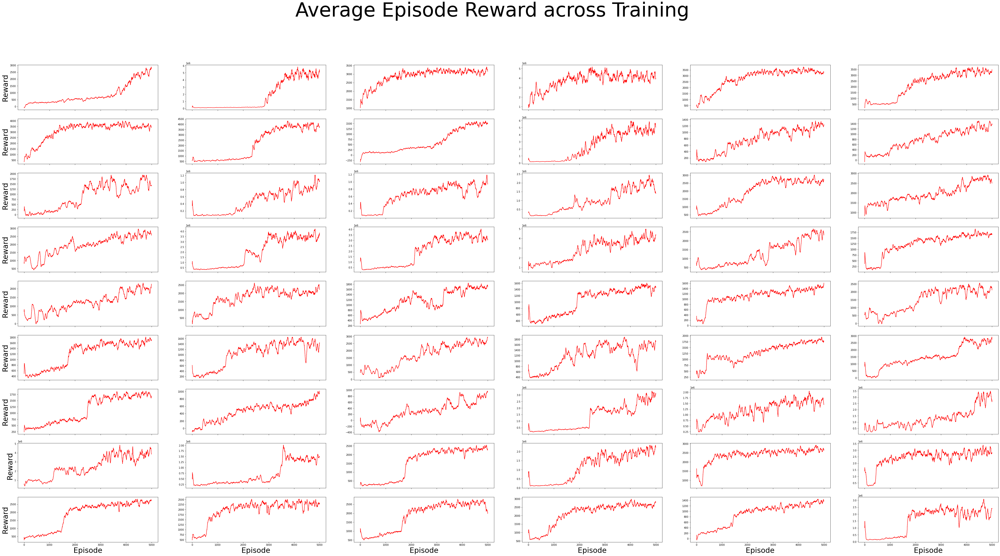

In [5]:
fig, axes = plt.subplots(9, 6, figsize = (8 * 9, 6 * 6), sharex = "col", sharey = "none")
fig.suptitle('Average Episode Reward across Training', fontsize = 80)

for i in range(9):
    for j in range(6):
        average_episode_reward = scipy.io.loadmat(parent_folder + results_subfolders[i * 6 + j] + '/episode_reward_mean.mat')['episode_reward_mean']
        
        ax = axes[i, j]
        ax.plot(range(5000), average_episode_reward.squeeze(0), '-r')
        ax.set_xticks(np.arange(0, 5001, 1000))

        if i == 8:
            ax.set_xlabel('Episode', fontsize = 30)
        if j == 0:
            ax.set_ylabel('Reward', fontsize = 30)
        
fig.savefig('Average Episode Reward across Training (Project 1).png')     

## Inequity aversion coefficients across three governing systems: Full-Libertarain, Semi-Libertarian/Utilitarian, Full-Utilitarian

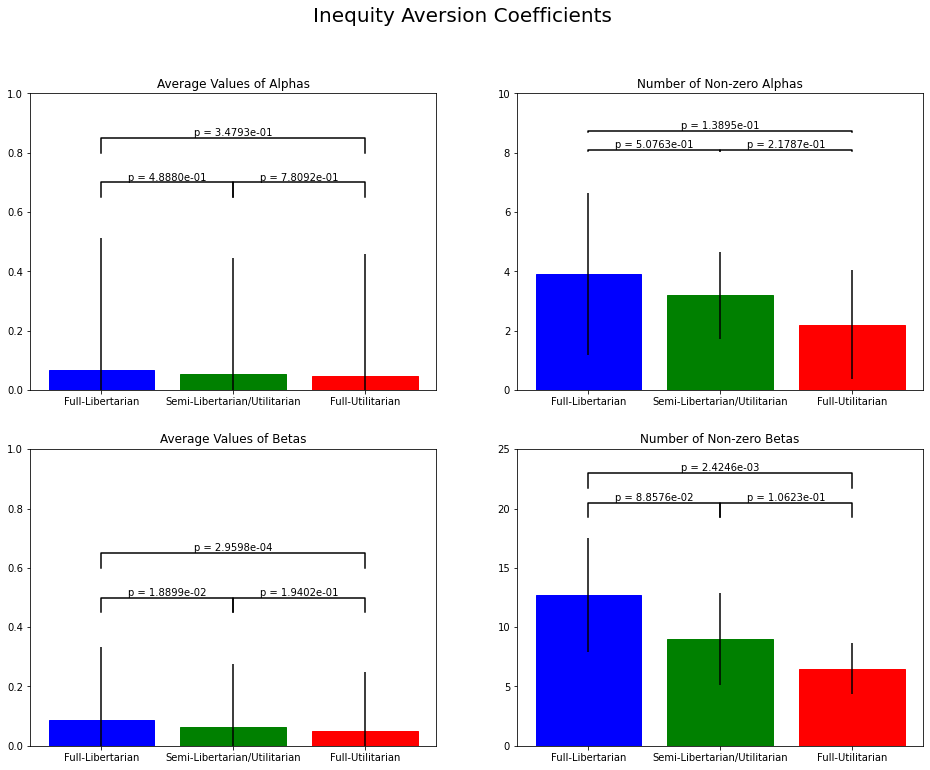

In [6]:
alpha_full_libertarian = []
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[5] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[6] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_libertarian = np.array(alpha_full_libertarian)

beta_full_libertarian = []
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[5] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[6] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/beta_opt.mat')['beta_opt'])
beta_full_libertarian = np.array(beta_full_libertarian)

alpha_semi_libertarian_utilitarian = []
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/alpha_opt.mat')['alpha_opt'])
alpha_semi_libertarian_utilitarian = np.array(alpha_semi_libertarian_utilitarian)

beta_semi_libertarian_utilitarian = []
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/beta_opt.mat')['beta_opt'])
beta_semi_libertarian_utilitarian = np.array(beta_semi_libertarian_utilitarian)

alpha_full_utilitarian = []
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[49] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[50] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/alpha_opt.mat')['alpha_opt'])
alpha_full_utilitarian = np.array(alpha_full_utilitarian)

beta_full_utilitarian = []
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[49] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[50] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/beta_opt.mat')['beta_opt'])
beta_full_utilitarian = np.array(beta_full_utilitarian)

fig, axs = plt.subplots(2, 2, figsize = (2 * 8, 2 * 6))
fig.suptitle('Inequity Aversion Coefficients', fontsize = 20)

ax = axs[0, 0]

ax.set_title('Average Values of Alphas', fontsize = 12)

bar_list = ax.bar(range(0, 3), [alpha_full_libertarian.mean(axis = (0, 1, 2)), 
                                alpha_semi_libertarian_utilitarian.mean(axis = (0, 1, 2)), 
                                alpha_full_utilitarian.mean(axis = (0, 1, 2))],                                
                                yerr = [alpha_full_libertarian.std(axis = (0, 1, 2)), 
                                        alpha_semi_libertarian_utilitarian.std(axis = (0, 1, 2)), 
                                        alpha_full_utilitarian.std(axis = (0, 1, 2))])

bar_list[0].set_color('b')
bar_list[1].set_color('g')
bar_list[2].set_color('r')
    
ax.set_ylim((0, 1))
ax.set_xticks(range(0, 3))
ax.set_xticklabels(['Full-Libertarian', 'Semi-Libertarian/Utilitarian', 'Full-Utilitarian'])
    
t_stat_01, p_value_01 = stats.ttest_ind(alpha_full_libertarian.flatten(), alpha_semi_libertarian_utilitarian.flatten(), equal_var = True, nan_policy = 'omit')
t_stat_02, p_value_02 = stats.ttest_ind(alpha_full_libertarian.flatten(), alpha_full_utilitarian.flatten(), equal_var = True, nan_policy = 'omit')
t_stat_12, p_value_12 = stats.ttest_ind(alpha_semi_libertarian_utilitarian.flatten(), alpha_full_utilitarian.flatten(), equal_var = True, nan_policy = 'omit')

barplot_annotate_brackets(0, 1, 'p = {:.4e}'.format(p_value_01), np.arange(3), [0.6, 0.6, 0.6])
barplot_annotate_brackets(1, 2, 'p = {:.4e}'.format(p_value_12), np.arange(3), [0.6, 0.6, 0.6])
barplot_annotate_brackets(0, 2, 'p = {:.4e}'.format(p_value_02), np.arange(3), [0.6, 0.6, 0.6], dh = 0.2)

ax = axs[0, 1]

ax.set_title('Number of Non-zero Alphas', fontsize = 12)

alpha_full_libertarian_nonzero = []
for i in range(alpha_full_libertarian.shape[0]):
    alpha_full_libertarian_nonzero.append(np.sum(alpha_full_libertarian[i] > 0))
alpha_full_libertarian_nonzero = np.array(alpha_full_libertarian_nonzero)
    
alpha_semi_libertarian_utilitarian_nonzero = []
for i in range(alpha_semi_libertarian_utilitarian.shape[0]):
    alpha_semi_libertarian_utilitarian_nonzero.append(np.sum(alpha_semi_libertarian_utilitarian[i] > 0))
alpha_semi_libertarian_utilitarian_nonzero = np.array(alpha_semi_libertarian_utilitarian_nonzero)
    
alpha_full_utilitarian_nonzero = []
for i in range(alpha_full_utilitarian.shape[0]):
    alpha_full_utilitarian_nonzero.append(np.sum(alpha_full_utilitarian[i] > 0))
alpha_full_utilitarian_nonzero = np.array(alpha_full_utilitarian_nonzero)

bar_list = ax.bar(range(0, 3), [alpha_full_libertarian_nonzero.mean(axis = 0), 
                                alpha_semi_libertarian_utilitarian_nonzero.mean(axis = 0), 
                                alpha_full_utilitarian_nonzero.mean(axis = 0)],                                
                                yerr = [alpha_full_libertarian_nonzero.std(axis = 0), 
                                        alpha_semi_libertarian_utilitarian_nonzero.std(axis = 0), 
                                        alpha_full_utilitarian_nonzero.std(axis = 0)])

bar_list[0].set_color('b')
bar_list[1].set_color('g')
bar_list[2].set_color('r')
    
ax.set_ylim((0, 10))
ax.set_xticks(range(0, 3))
ax.set_xticklabels(['Full-Libertarian', 'Semi-Libertarian/Utilitarian', 'Full-Utilitarian'])
    
t_stat_01, p_value_01 = stats.ttest_ind(alpha_full_libertarian_nonzero, alpha_semi_libertarian_utilitarian_nonzero, equal_var = True, nan_policy = 'omit')
t_stat_02, p_value_02 = stats.ttest_ind(alpha_full_libertarian_nonzero, alpha_full_utilitarian_nonzero, equal_var = True, nan_policy = 'omit')
t_stat_12, p_value_12 = stats.ttest_ind(alpha_semi_libertarian_utilitarian_nonzero, alpha_full_utilitarian_nonzero, equal_var = True, nan_policy = 'omit')

barplot_annotate_brackets(0, 1, 'p = {:.4e}'.format(p_value_01), np.arange(3), [8, 8, 8])
barplot_annotate_brackets(1, 2, 'p = {:.4e}'.format(p_value_12), np.arange(3), [8, 8, 8])
barplot_annotate_brackets(0, 2, 'p = {:.4e}'.format(p_value_02), np.arange(3), [8, 8, 8], dh = 0.7)

ax = axs[1, 0]

ax.set_title('Average Values of Betas', fontsize = 12)

bar_list = ax.bar(range(0, 3), [beta_full_libertarian.mean(axis = (0, 1, 2)), 
                                beta_semi_libertarian_utilitarian.mean(axis = (0, 1, 2)), 
                                beta_full_utilitarian.mean(axis = (0, 1, 2))],                                
                                yerr = [beta_full_libertarian.std(axis = (0, 1, 2)), 
                                        beta_semi_libertarian_utilitarian.std(axis = (0, 1, 2)), 
                                        beta_full_utilitarian.std(axis = (0, 1, 2))])

bar_list[0].set_color('b')
bar_list[1].set_color('g')
bar_list[2].set_color('r')
    
ax.set_ylim((0, 1))
ax.set_xticks(range(0, 3))
ax.set_xticklabels(['Full-Libertarian', 'Semi-Libertarian/Utilitarian', 'Full-Utilitarian'])
    
t_stat_01, p_value_01 = stats.ttest_ind(beta_full_libertarian.flatten(), beta_semi_libertarian_utilitarian.flatten(), equal_var = True, nan_policy = 'omit')
t_stat_02, p_value_02 = stats.ttest_ind(beta_full_libertarian.flatten(), beta_full_utilitarian.flatten(), equal_var = True, nan_policy = 'omit')
t_stat_12, p_value_12 = stats.ttest_ind(beta_semi_libertarian_utilitarian.flatten(), beta_full_utilitarian.flatten(), equal_var = True, nan_policy = 'omit')

barplot_annotate_brackets(0, 1, 'p = {:.4e}'.format(p_value_01), np.arange(3), [0.4, 0.4, 0.4])
barplot_annotate_brackets(1, 2, 'p = {:.4e}'.format(p_value_12), np.arange(3), [0.4, 0.4, 0.4])
barplot_annotate_brackets(0, 2, 'p = {:.4e}'.format(p_value_02), np.arange(3), [0.4, 0.4, 0.4], dh = 0.2)

ax = axs[1, 1]

ax.set_title('Number of Non-zero Betas', fontsize = 12)

beta_full_libertarian_nonzero = []
for i in range(beta_full_libertarian.shape[0]):
    beta_full_libertarian_nonzero.append(np.sum(beta_full_libertarian[i] > 0))
beta_full_libertarian_nonzero = np.array(beta_full_libertarian_nonzero)
    
beta_semi_libertarian_utilitarian_nonzero = []
for i in range(beta_semi_libertarian_utilitarian.shape[0]):
    beta_semi_libertarian_utilitarian_nonzero.append(np.sum(beta_semi_libertarian_utilitarian[i] > 0))
beta_semi_libertarian_utilitarian_nonzero = np.array(beta_semi_libertarian_utilitarian_nonzero)
    
beta_full_utilitarian_nonzero = []
for i in range(beta_full_utilitarian.shape[0]):
    beta_full_utilitarian_nonzero.append(np.sum(beta_full_utilitarian[i] > 0))
beta_full_utilitarian_nonzero = np.array(beta_full_utilitarian_nonzero)

bar_list = ax.bar(range(0, 3), [beta_full_libertarian_nonzero.mean(axis = 0), 
                                beta_semi_libertarian_utilitarian_nonzero.mean(axis = 0), 
                                beta_full_utilitarian_nonzero.mean(axis = 0)],                                
                                yerr = [beta_full_libertarian_nonzero.std(axis = 0), 
                                        beta_semi_libertarian_utilitarian_nonzero.std(axis = 0), 
                                        beta_full_utilitarian_nonzero.std(axis = 0)])

bar_list[0].set_color('b')
bar_list[1].set_color('g')
bar_list[2].set_color('r')
    
ax.set_ylim((0, 25))
ax.set_xticks(range(0, 3))
ax.set_xticklabels(['Full-Libertarian', 'Semi-Libertarian/Utilitarian', 'Full-Utilitarian'])
    
t_stat_01, p_value_01 = stats.ttest_ind(beta_full_libertarian_nonzero, beta_semi_libertarian_utilitarian_nonzero, equal_var = True, nan_policy = 'omit')
t_stat_02, p_value_02 = stats.ttest_ind(beta_full_libertarian_nonzero, beta_full_utilitarian_nonzero, equal_var = True, nan_policy = 'omit')
t_stat_12, p_value_12 = stats.ttest_ind(beta_semi_libertarian_utilitarian_nonzero, beta_full_utilitarian_nonzero, equal_var = True, nan_policy = 'omit')

barplot_annotate_brackets(0, 1, 'p = {:.4e}'.format(p_value_01), np.arange(3), [18, 18, 18])
barplot_annotate_brackets(1, 2, 'p = {:.4e}'.format(p_value_12), np.arange(3), [18, 18, 18])
barplot_annotate_brackets(0, 2, 'p = {:.4e}'.format(p_value_02), np.arange(3), [18, 18, 18], dh = 0.15)

fig.savefig('Inequity Aversion Coefficients for Three Governing Systems (Project 1).png')

## Inequity aversion coefficients in the Semi-Libertarian/Utilitarian governing system across three governing institutions: Inclusive, Arbitrary, Extractive

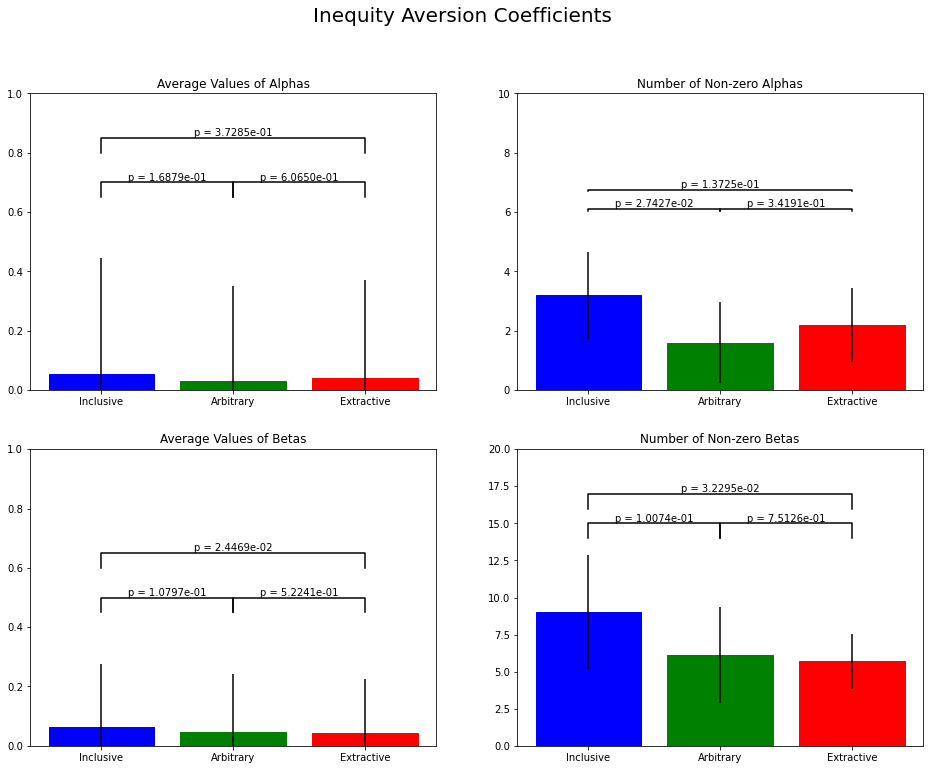

In [7]:
alpha_inclusive = []
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/alpha_opt.mat')['alpha_opt'])
alpha_inclusive = np.array(alpha_inclusive)

beta_inclusive = []
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/beta_opt.mat')['beta_opt'])
beta_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/beta_opt.mat')['beta_opt'])
beta_inclusive = np.array(beta_inclusive)

alpha_arbitrary = []
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/alpha_opt.mat')['alpha_opt'])
alpha_arbitrary = np.array(alpha_arbitrary)

beta_arbitrary = []
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/beta_opt.mat')['beta_opt'])
beta_arbitrary = np.array(beta_arbitrary)

alpha_extractive = []
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/alpha_opt.mat')['alpha_opt'])
alpha_extractive = np.array(alpha_extractive)

beta_extractive = []
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/beta_opt.mat')['beta_opt'])
beta_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/beta_opt.mat')['beta_opt'])
beta_extractive = np.array(beta_extractive)

fig, axs = plt.subplots(2, 2, figsize = (2 * 8, 2 * 6))
fig.suptitle('Inequity Aversion Coefficients', fontsize = 20)

ax = axs[0, 0]

ax.set_title('Average Values of Alphas', fontsize = 12)

bar_list = ax.bar(range(0, 3), [alpha_inclusive.mean(axis = (0, 1, 2)), 
                                alpha_arbitrary.mean(axis = (0, 1, 2)), 
                                alpha_extractive.mean(axis = (0, 1, 2))],                                
                                yerr = [alpha_inclusive.std(axis = (0, 1, 2)), 
                                        alpha_arbitrary.std(axis = (0, 1, 2)), 
                                        alpha_extractive.std(axis = (0, 1, 2))])

bar_list[0].set_color('b')
bar_list[1].set_color('g')
bar_list[2].set_color('r')
    
ax.set_ylim((0, 1))
ax.set_xticks(range(0, 3))
ax.set_xticklabels(['Inclusive', 'Arbitrary', 'Extractive'])
    
t_stat_01, p_value_01 = stats.ttest_ind(alpha_inclusive.flatten(), alpha_arbitrary.flatten(), equal_var = True, nan_policy = 'omit')
t_stat_02, p_value_02 = stats.ttest_ind(alpha_inclusive.flatten(), alpha_extractive.flatten(), equal_var = True, nan_policy = 'omit')
t_stat_12, p_value_12 = stats.ttest_ind(alpha_arbitrary.flatten(), alpha_extractive.flatten(), equal_var = True, nan_policy = 'omit')

barplot_annotate_brackets(0, 1, 'p = {:.4e}'.format(p_value_01), np.arange(3), [0.6, 0.6, 0.6])
barplot_annotate_brackets(1, 2, 'p = {:.4e}'.format(p_value_12), np.arange(3), [0.6, 0.6, 0.6])
barplot_annotate_brackets(0, 2, 'p = {:.4e}'.format(p_value_02), np.arange(3), [0.6, 0.6, 0.6], dh = 0.2)

ax = axs[0, 1]

ax.set_title('Number of Non-zero Alphas', fontsize = 12)

alpha_inclusive_nonzero = []
for i in range(alpha_inclusive.shape[0]):
    alpha_inclusive_nonzero.append(np.sum(alpha_inclusive[i] > 0))
alpha_inclusive_nonzero = np.array(alpha_inclusive_nonzero)
    
alpha_arbitrary_nonzero = []
for i in range(alpha_arbitrary.shape[0]):
    alpha_arbitrary_nonzero.append(np.sum(alpha_arbitrary[i] > 0))
alpha_arbitrary_nonzero = np.array(alpha_arbitrary_nonzero)
    
alpha_extractive_nonzero = []
for i in range(alpha_extractive.shape[0]):
    alpha_extractive_nonzero.append(np.sum(alpha_extractive[i] > 0))
alpha_extractive_nonzero = np.array(alpha_extractive_nonzero)

bar_list = ax.bar(range(0, 3), [alpha_inclusive_nonzero.mean(axis = 0), 
                                alpha_arbitrary_nonzero.mean(axis = 0), 
                                alpha_extractive_nonzero.mean(axis = 0)],                                
                                yerr = [alpha_inclusive_nonzero.std(axis = 0), 
                                        alpha_arbitrary_nonzero.std(axis = 0), 
                                        alpha_extractive_nonzero.std(axis = 0)])

bar_list[0].set_color('b')
bar_list[1].set_color('g')
bar_list[2].set_color('r')
    
ax.set_ylim((0, 10))
ax.set_xticks(range(0, 3))
ax.set_xticklabels(['Inclusive', 'Arbitrary', 'Extractive'])
    
t_stat_01, p_value_01 = stats.ttest_ind(alpha_inclusive_nonzero, alpha_arbitrary_nonzero, equal_var = True, nan_policy = 'omit')
t_stat_02, p_value_02 = stats.ttest_ind(alpha_inclusive_nonzero, alpha_extractive_nonzero, equal_var = True, nan_policy = 'omit')
t_stat_12, p_value_12 = stats.ttest_ind(alpha_arbitrary_nonzero, alpha_extractive_nonzero, equal_var = True, nan_policy = 'omit')

barplot_annotate_brackets(0, 1, 'p = {:.4e}'.format(p_value_01), np.arange(3), [6, 6, 6])
barplot_annotate_brackets(1, 2, 'p = {:.4e}'.format(p_value_12), np.arange(3), [6, 6, 6])
barplot_annotate_brackets(0, 2, 'p = {:.4e}'.format(p_value_02), np.arange(3), [6, 6, 6], dh = 0.7)

ax = axs[1, 0]

ax.set_title('Average Values of Betas', fontsize = 12)

bar_list = ax.bar(range(0, 3), [beta_inclusive.mean(axis = (0, 1, 2)), 
                                beta_arbitrary.mean(axis = (0, 1, 2)), 
                                beta_extractive.mean(axis = (0, 1, 2))],                                
                                yerr = [beta_inclusive.std(axis = (0, 1, 2)), 
                                        beta_arbitrary.std(axis = (0, 1, 2)), 
                                        beta_extractive.std(axis = (0, 1, 2))])

bar_list[0].set_color('b')
bar_list[1].set_color('g')
bar_list[2].set_color('r')
    
ax.set_ylim((0, 1))
ax.set_xticks(range(0, 3))
ax.set_xticklabels(['Inclusive', 'Arbitrary', 'Extractive'])
    
t_stat_01, p_value_01 = stats.ttest_ind(beta_inclusive.flatten(), beta_arbitrary.flatten(), equal_var = True, nan_policy = 'omit')
t_stat_02, p_value_02 = stats.ttest_ind(beta_inclusive.flatten(), beta_extractive.flatten(), equal_var = True, nan_policy = 'omit')
t_stat_12, p_value_12 = stats.ttest_ind(beta_arbitrary.flatten(), beta_extractive.flatten(), equal_var = True, nan_policy = 'omit')

barplot_annotate_brackets(0, 1, 'p = {:.4e}'.format(p_value_01), np.arange(3), [0.4, 0.4, 0.4])
barplot_annotate_brackets(1, 2, 'p = {:.4e}'.format(p_value_12), np.arange(3), [0.4, 0.4, 0.4])
barplot_annotate_brackets(0, 2, 'p = {:.4e}'.format(p_value_02), np.arange(3), [0.4, 0.4, 0.4], dh = 0.2)

ax = axs[1, 1]

ax.set_title('Number of Non-zero Betas', fontsize = 12)

beta_inclusive_nonzero = []
for i in range(beta_inclusive.shape[0]):
    beta_inclusive_nonzero.append(np.sum(beta_inclusive[i] > 0))
beta_inclusive_nonzero = np.array(beta_inclusive_nonzero)
    
beta_arbitrary_nonzero = []
for i in range(beta_arbitrary.shape[0]):
    beta_arbitrary_nonzero.append(np.sum(beta_arbitrary[i] > 0))
beta_arbitrary_nonzero = np.array(beta_arbitrary_nonzero)
    
beta_extractive_nonzero = []
for i in range(beta_extractive.shape[0]):
    beta_extractive_nonzero.append(np.sum(beta_extractive[i] > 0))
beta_extractive_nonzero = np.array(beta_extractive_nonzero)

bar_list = ax.bar(range(0, 3), [beta_inclusive_nonzero.mean(axis = 0), 
                                beta_arbitrary_nonzero.mean(axis = 0), 
                                beta_extractive_nonzero.mean(axis = 0)],                                
                                yerr = [beta_inclusive_nonzero.std(axis = 0), 
                                        beta_arbitrary_nonzero.std(axis = 0), 
                                        beta_extractive_nonzero.std(axis = 0)])

bar_list[0].set_color('b')
bar_list[1].set_color('g')
bar_list[2].set_color('r')
    
ax.set_ylim((0, 20))
ax.set_xticks(range(0, 3))
ax.set_xticklabels(['Inclusive', 'Arbitrary', 'Extractive'])
    
t_stat_01, p_value_01 = stats.ttest_ind(beta_inclusive_nonzero, beta_arbitrary_nonzero, equal_var = True, nan_policy = 'omit')
t_stat_02, p_value_02 = stats.ttest_ind(beta_inclusive_nonzero, beta_extractive_nonzero, equal_var = True, nan_policy = 'omit')
t_stat_12, p_value_12 = stats.ttest_ind(beta_arbitrary_nonzero, beta_extractive_nonzero, equal_var = True, nan_policy = 'omit')

barplot_annotate_brackets(0, 1, 'p = {:.4e}'.format(p_value_01), np.arange(3), [13, 13, 13])
barplot_annotate_brackets(1, 2, 'p = {:.4e}'.format(p_value_12), np.arange(3), [13, 13, 13])
barplot_annotate_brackets(0, 2, 'p = {:.4e}'.format(p_value_02), np.arange(3), [13, 13, 13], dh = 0.15)

fig.savefig('Inequity Aversion Coefficients for Three Governing Institutions (Project 1).png')

## Productivity, Equality, and Maximin across three governing systems: Full-Libertarian, Semi-Libertarian/Utilitarian, Full-Utilitarian

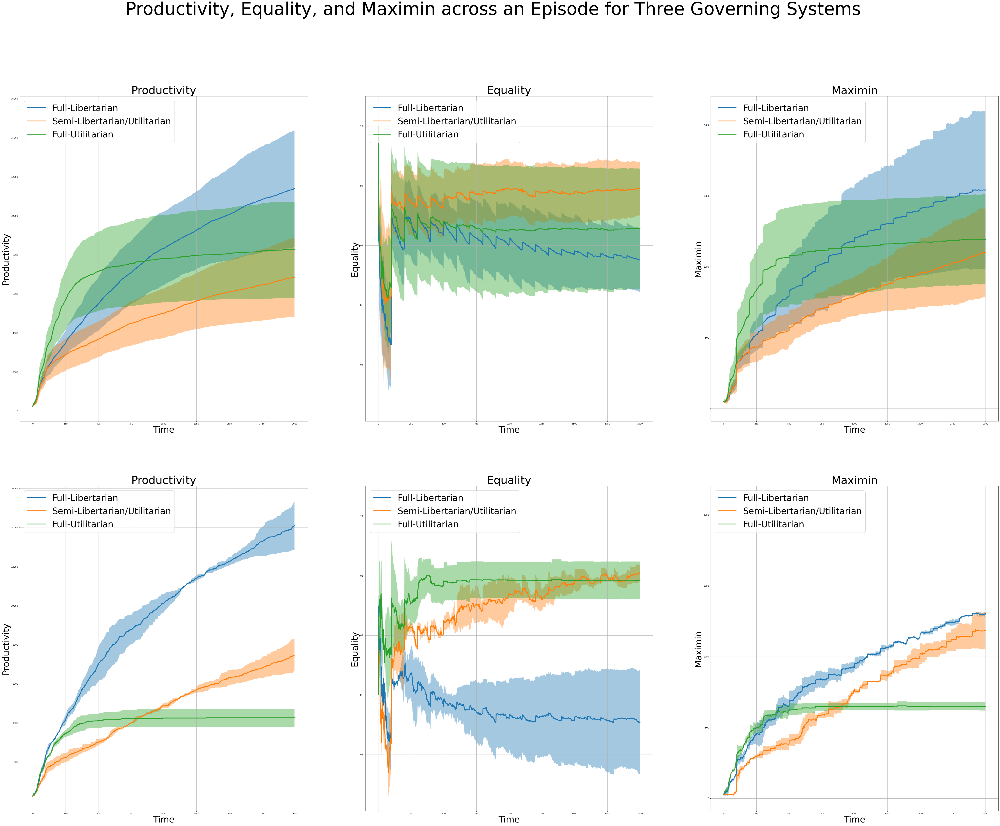

In [8]:
productivity_full_libertarian = []
productivity_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/productivity.mat')['productivity'])
productivity_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/productivity.mat')['productivity'])
productivity_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/productivity.mat')['productivity'])
productivity_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/productivity.mat')['productivity'])
productivity_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/productivity.mat')['productivity'])
productivity_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/productivity.mat')['productivity'])
productivity_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/productivity.mat')['productivity'])
productivity_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/productivity.mat')['productivity'])
productivity_full_libertarian = np.array(productivity_full_libertarian).squeeze(1)

equality_full_libertarian = []
equality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/equality.mat')['equality'])
equality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/equality.mat')['equality'])
equality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/equality.mat')['equality'])
equality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/equality.mat')['equality'])
equality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/equality.mat')['equality'])
equality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/equality.mat')['equality'])
equality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/equality.mat')['equality'])
equality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/equality.mat')['equality'])
equality_full_libertarian = np.array(equality_full_libertarian).squeeze(1)

maximin_full_libertarian = []
maximin_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/maximin.mat')['maximin'])
maximin_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/maximin.mat')['maximin'])
maximin_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/maximin.mat')['maximin'])
maximin_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/maximin.mat')['maximin'])
maximin_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/maximin.mat')['maximin'])
maximin_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/maximin.mat')['maximin'])
maximin_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/maximin.mat')['maximin'])
maximin_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/maximin.mat')['maximin'])
maximin_full_libertarian = np.array(maximin_full_libertarian).squeeze(1)

all_initialinequality_full_libertarian = []
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[5] + '/productivity.mat')['productivity'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[6] + '/productivity.mat')['productivity'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[5] + '/equality.mat')['equality'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[6] + '/equality.mat')['equality'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[5] + '/maximin.mat')['maximin'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[6] + '/maximin.mat')['maximin'])
all_initialinequality_full_libertarian = np.array(all_initialinequality_full_libertarian).squeeze(1)

productivity_semi_libertarian_utilitarian = []
productivity_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/productivity.mat')['productivity'])
productivity_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/productivity.mat')['productivity'])
productivity_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/productivity.mat')['productivity'])
productivity_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/productivity.mat')['productivity'])
productivity_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/productivity.mat')['productivity'])
productivity_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/productivity.mat')['productivity'])
productivity_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/productivity.mat')['productivity'])
productivity_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/productivity.mat')['productivity'])
productivity_semi_libertarian_utilitarian = np.array(productivity_semi_libertarian_utilitarian).squeeze(1)

equality_semi_libertarian_utilitarian = []
equality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/equality.mat')['equality'])
equality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/equality.mat')['equality'])
equality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/equality.mat')['equality'])
equality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/equality.mat')['equality'])
equality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/equality.mat')['equality'])
equality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/equality.mat')['equality'])
equality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/equality.mat')['equality'])
equality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/equality.mat')['equality'])
equality_semi_libertarian_utilitarian = np.array(equality_semi_libertarian_utilitarian).squeeze(1)

maximin_semi_libertarian_utilitarian = []
maximin_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/maximin.mat')['maximin'])
maximin_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/maximin.mat')['maximin'])
maximin_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/maximin.mat')['maximin'])
maximin_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/maximin.mat')['maximin'])
maximin_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/maximin.mat')['maximin'])
maximin_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/maximin.mat')['maximin'])
maximin_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/maximin.mat')['maximin'])
maximin_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/maximin.mat')['maximin'])
maximin_semi_libertarian_utilitarian = np.array(maximin_semi_libertarian_utilitarian).squeeze(1)

all_initialinequality_semi_libertarian_utilitarian = []
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/productivity.mat')['productivity'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/productivity.mat')['productivity'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/equality.mat')['equality'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/equality.mat')['equality'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/maximin.mat')['maximin'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/maximin.mat')['maximin'])
all_initialinequality_semi_libertarian_utilitarian = np.array(all_initialinequality_semi_libertarian_utilitarian).squeeze(1)

productivity_full_utilitarian = []
productivity_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/productivity.mat')['productivity'])
productivity_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/productivity.mat')['productivity'])
productivity_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/productivity.mat')['productivity'])
productivity_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/productivity.mat')['productivity'])
productivity_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/productivity.mat')['productivity'])
productivity_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/productivity.mat')['productivity'])
productivity_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/productivity.mat')['productivity'])
productivity_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/productivity.mat')['productivity'])
productivity_full_utilitarian = np.array(productivity_full_utilitarian).squeeze(1)

equality_full_utilitarian = []
equality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/equality.mat')['equality'])
equality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/equality.mat')['equality'])
equality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/equality.mat')['equality'])
equality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/equality.mat')['equality'])
equality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/equality.mat')['equality'])
equality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/equality.mat')['equality'])
equality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/equality.mat')['equality'])
equality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/equality.mat')['equality'])
equality_full_utilitarian = np.array(equality_full_utilitarian).squeeze(1)

maximin_full_utilitarian = []
maximin_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/maximin.mat')['maximin'])
maximin_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/maximin.mat')['maximin'])
maximin_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/maximin.mat')['maximin'])
maximin_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/maximin.mat')['maximin'])
maximin_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/maximin.mat')['maximin'])
maximin_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/maximin.mat')['maximin'])
maximin_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/maximin.mat')['maximin'])
maximin_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/maximin.mat')['maximin'])
maximin_full_utilitarian = np.array(maximin_full_utilitarian).squeeze(1)

all_initialinequality_full_utilitarian = []
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[49] + '/productivity.mat')['productivity'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[50] + '/productivity.mat')['productivity'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[49] + '/equality.mat')['equality'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[50] + '/equality.mat')['equality'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[49] + '/maximin.mat')['maximin'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[50] + '/maximin.mat')['maximin'])
all_initialinequality_full_utilitarian = np.array(all_initialinequality_full_utilitarian).squeeze(1)

fig, axes = plt.subplots(2, 3, figsize = (40 * 2, 20 * 3), sharex = 'row', sharey = 'col')
fig.suptitle('Productivity, Equality, and Maximin across an Episode for Three Governing Systems', fontsize = 80)

ax = axes[0, 0]
ax.plot(np.arange(2000), productivity_full_libertarian.mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), productivity_semi_libertarian_utilitarian.mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), productivity_full_utilitarian.mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), productivity_full_libertarian.mean(axis = 0) + productivity_full_libertarian.std(axis = 0), productivity_full_libertarian.mean(axis = 0) - productivity_full_libertarian.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), productivity_semi_libertarian_utilitarian.mean(axis = 0) + productivity_semi_libertarian_utilitarian.std(axis = 0), productivity_semi_libertarian_utilitarian.mean(axis = 0) - productivity_semi_libertarian_utilitarian.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), productivity_full_utilitarian.mean(axis = 0) + productivity_full_utilitarian.std(axis = 0), productivity_full_utilitarian.mean(axis = 0) - productivity_full_utilitarian.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Productivity', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Productivity', fontsize = 40)
ax.grid()

ax = axes[0, 1]
ax.plot(np.arange(2000), equality_full_libertarian.mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), equality_semi_libertarian_utilitarian.mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), equality_full_utilitarian.mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), equality_full_libertarian.mean(axis = 0) + equality_full_libertarian.std(axis = 0), equality_full_libertarian.mean(axis = 0) - equality_full_libertarian.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), equality_semi_libertarian_utilitarian.mean(axis = 0) + equality_semi_libertarian_utilitarian.std(axis = 0), equality_semi_libertarian_utilitarian.mean(axis = 0) - equality_semi_libertarian_utilitarian.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), equality_full_utilitarian.mean(axis = 0) + equality_full_utilitarian.std(axis = 0), equality_full_utilitarian.mean(axis = 0) - equality_full_utilitarian.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Equality', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Equality', fontsize = 40)
ax.grid()

ax = axes[0, 2]
ax.plot(np.arange(2000), maximin_full_libertarian.mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), maximin_semi_libertarian_utilitarian.mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), maximin_full_utilitarian.mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), maximin_full_libertarian.mean(axis = 0) + maximin_full_libertarian.std(axis = 0), maximin_full_libertarian.mean(axis = 0) - maximin_full_libertarian.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), maximin_semi_libertarian_utilitarian.mean(axis = 0) + maximin_semi_libertarian_utilitarian.std(axis = 0), maximin_semi_libertarian_utilitarian.mean(axis = 0) - maximin_semi_libertarian_utilitarian.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), maximin_full_utilitarian.mean(axis = 0) + maximin_full_utilitarian.std(axis = 0), maximin_full_utilitarian.mean(axis = 0) - maximin_full_utilitarian.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Maximin', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Maximin', fontsize = 40)
ax.grid()

ax = axes[1, 0]
ax.plot(np.arange(2000), all_initialinequality_full_libertarian[0:2, :].mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[0:2, :].mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), all_initialinequality_full_utilitarian[0:2, :].mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), all_initialinequality_full_libertarian[0:2, :].mean(axis = 0) + all_initialinequality_full_libertarian[0:2, :].std(axis = 0), all_initialinequality_full_libertarian[0:2, :].mean(axis = 0) - all_initialinequality_full_libertarian[0:2, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[0:2, :].mean(axis = 0) + all_initialinequality_semi_libertarian_utilitarian[0:2, :].std(axis = 0), all_initialinequality_semi_libertarian_utilitarian[0:2, :].mean(axis = 0) - all_initialinequality_semi_libertarian_utilitarian[0:2, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_full_utilitarian[0:2, :].mean(axis = 0) + all_initialinequality_full_utilitarian[0:2, :].std(axis = 0), all_initialinequality_full_utilitarian[0:2, :].mean(axis = 0) - all_initialinequality_full_utilitarian[0:2, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Productivity', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Productivity', fontsize = 40)
ax.grid()

ax = axes[1, 1]
ax.plot(np.arange(2000), all_initialinequality_full_libertarian[2:4, :].mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[2:4, :].mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), all_initialinequality_full_utilitarian[2:4, :].mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), all_initialinequality_full_libertarian[2:4, :].mean(axis = 0) + all_initialinequality_full_libertarian[2:4, :].std(axis = 0), all_initialinequality_full_libertarian[2:4, :].mean(axis = 0) - all_initialinequality_full_libertarian[2:4, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[2:4, :].mean(axis = 0) + all_initialinequality_semi_libertarian_utilitarian[2:4, :].std(axis = 0), all_initialinequality_semi_libertarian_utilitarian[2:4, :].mean(axis = 0) - all_initialinequality_semi_libertarian_utilitarian[2:4, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_full_utilitarian[2:4, :].mean(axis = 0) + all_initialinequality_full_utilitarian[2:4, :].std(axis = 0), all_initialinequality_full_utilitarian[2:4, :].mean(axis = 0) - all_initialinequality_full_utilitarian[2:4, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Equality', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Equality', fontsize = 40)
ax.grid()

ax = axes[1, 2]
ax.plot(np.arange(2000), all_initialinequality_full_libertarian[4:, :].mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[4:, :].mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), all_initialinequality_full_utilitarian[4:, :].mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), all_initialinequality_full_libertarian[4:, :].mean(axis = 0) + all_initialinequality_full_libertarian[4:, :].std(axis = 0), all_initialinequality_full_libertarian[4:, :].mean(axis = 0) - all_initialinequality_full_libertarian[4:, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[4:, :].mean(axis = 0) + all_initialinequality_semi_libertarian_utilitarian[4:, :].std(axis = 0), all_initialinequality_semi_libertarian_utilitarian[4:, :].mean(axis = 0) - all_initialinequality_semi_libertarian_utilitarian[4:, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_full_utilitarian[4:, :].mean(axis = 0) + all_initialinequality_full_utilitarian[4:, :].std(axis = 0), all_initialinequality_full_utilitarian[4:, :].mean(axis = 0) - all_initialinequality_full_utilitarian[4:, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Maximin', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Maximin', fontsize = 40)
ax.grid()

fig.savefig('Productivity, Equality, and Maximin across an Episode for Three Governing Systems (Project 1).png')

## Amount of three material resources - Wood, Stone, and Iron - in the environment across three governing systems: Full-Libertarian, Semi-Libertarian/Utilitarian, Full-Utilitarian

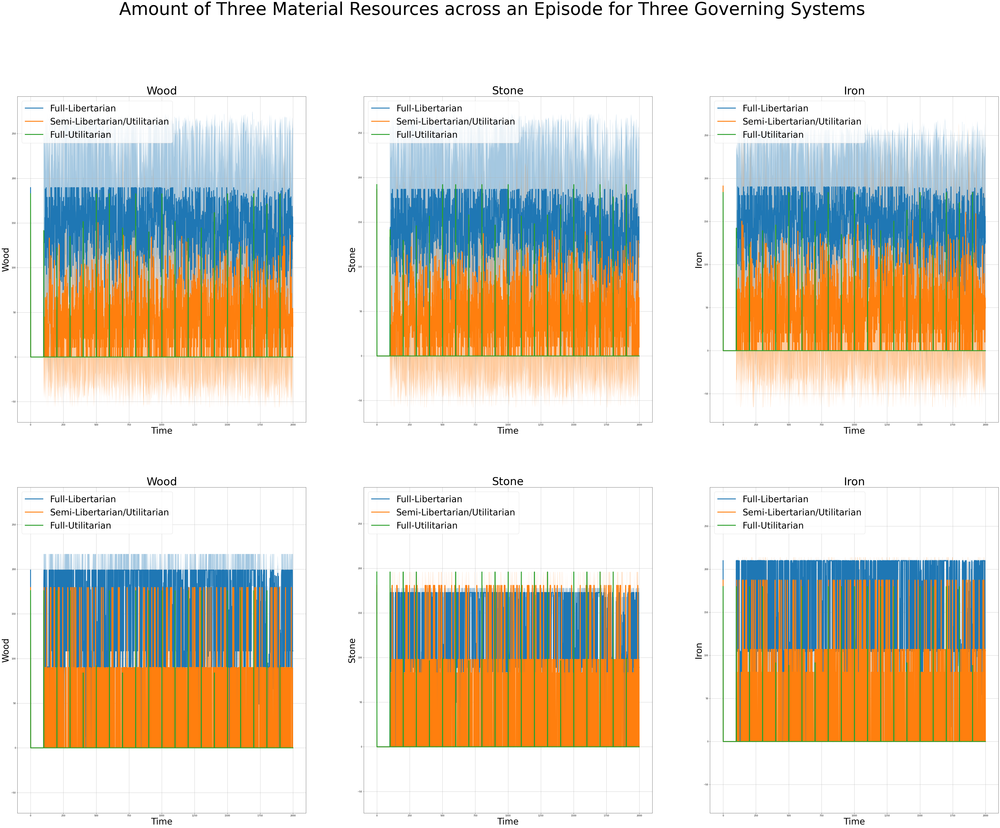

In [9]:
wood_full_libertarian = []
wood_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_libertarian = np.array(wood_full_libertarian).squeeze(1)

stone_full_libertarian = []
stone_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_libertarian = np.array(stone_full_libertarian).squeeze(1)

iron_full_libertarian = []
iron_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_libertarian = np.array(iron_full_libertarian).squeeze(1)

all_initialinequality_full_libertarian = []
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[5] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[6] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[5] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[6] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[5] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[6] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_full_libertarian = np.array(all_initialinequality_full_libertarian).squeeze(1)

wood_semi_libertarian_utilitarian = []
wood_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/wood_amount_world.mat')['wood_amount_world'])
wood_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/wood_amount_world.mat')['wood_amount_world'])
wood_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/wood_amount_world.mat')['wood_amount_world'])
wood_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/wood_amount_world.mat')['wood_amount_world'])
wood_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/wood_amount_world.mat')['wood_amount_world'])
wood_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/wood_amount_world.mat')['wood_amount_world'])
wood_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/wood_amount_world.mat')['wood_amount_world'])
wood_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/wood_amount_world.mat')['wood_amount_world'])
wood_semi_libertarian_utilitarian = np.array(wood_semi_libertarian_utilitarian).squeeze(1)

stone_semi_libertarian_utilitarian = []
stone_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/stone_amount_world.mat')['stone_amount_world'])
stone_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/stone_amount_world.mat')['stone_amount_world'])
stone_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/stone_amount_world.mat')['stone_amount_world'])
stone_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/stone_amount_world.mat')['stone_amount_world'])
stone_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/stone_amount_world.mat')['stone_amount_world'])
stone_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/stone_amount_world.mat')['stone_amount_world'])
stone_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/stone_amount_world.mat')['stone_amount_world'])
stone_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/stone_amount_world.mat')['stone_amount_world'])
stone_semi_libertarian_utilitarian = np.array(stone_semi_libertarian_utilitarian).squeeze(1)

iron_semi_libertarian_utilitarian = []
iron_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/iron_amount_world.mat')['iron_amount_world'])
iron_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/iron_amount_world.mat')['iron_amount_world'])
iron_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/iron_amount_world.mat')['iron_amount_world'])
iron_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/iron_amount_world.mat')['iron_amount_world'])
iron_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/iron_amount_world.mat')['iron_amount_world'])
iron_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/iron_amount_world.mat')['iron_amount_world'])
iron_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/iron_amount_world.mat')['iron_amount_world'])
iron_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/iron_amount_world.mat')['iron_amount_world'])
iron_semi_libertarian_utilitarian = np.array(iron_semi_libertarian_utilitarian).squeeze(1)

all_initialinequality_semi_libertarian_utilitarian = []
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_semi_libertarian_utilitarian = np.array(all_initialinequality_semi_libertarian_utilitarian).squeeze(1)

wood_full_utilitarian = []
wood_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/wood_amount_world.mat')['wood_amount_world'])
wood_full_utilitarian = np.array(wood_full_utilitarian).squeeze(1)

stone_full_utilitarian = []
stone_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/stone_amount_world.mat')['stone_amount_world'])
stone_full_utilitarian = np.array(stone_full_utilitarian).squeeze(1)

iron_full_utilitarian = []
iron_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/iron_amount_world.mat')['iron_amount_world'])
iron_full_utilitarian = np.array(iron_full_utilitarian).squeeze(1)

all_initialinequality_full_utilitarian = []
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[49] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[50] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[49] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[50] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[49] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[50] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_full_utilitarian = np.array(all_initialinequality_full_utilitarian).squeeze(1)

fig, axes = plt.subplots(2, 3, figsize = (40 * 2, 20 * 3), sharex = 'row', sharey = 'col')
fig.suptitle('Amount of Three Material Resources across an Episode for Three Governing Systems', fontsize = 80)

ax = axes[0, 0]
ax.plot(np.arange(2000), wood_full_libertarian.mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), wood_semi_libertarian_utilitarian.mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), wood_full_utilitarian.mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), wood_full_libertarian.mean(axis = 0) + wood_full_libertarian.std(axis = 0), wood_full_libertarian.mean(axis = 0) - wood_full_libertarian.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), wood_semi_libertarian_utilitarian.mean(axis = 0) + wood_semi_libertarian_utilitarian.std(axis = 0), wood_semi_libertarian_utilitarian.mean(axis = 0) - wood_semi_libertarian_utilitarian.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), wood_full_utilitarian.mean(axis = 0) + wood_full_utilitarian.std(axis = 0), wood_full_utilitarian.mean(axis = 0) - wood_full_utilitarian.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Wood', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Wood', fontsize = 40)
ax.grid()

ax = axes[0, 1]
ax.plot(np.arange(2000), stone_full_libertarian.mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), stone_semi_libertarian_utilitarian.mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), stone_full_utilitarian.mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), stone_full_libertarian.mean(axis = 0) + stone_full_libertarian.std(axis = 0), stone_full_libertarian.mean(axis = 0) - stone_full_libertarian.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), stone_semi_libertarian_utilitarian.mean(axis = 0) + stone_semi_libertarian_utilitarian.std(axis = 0), stone_semi_libertarian_utilitarian.mean(axis = 0) - stone_semi_libertarian_utilitarian.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), stone_full_utilitarian.mean(axis = 0) + stone_full_utilitarian.std(axis = 0), stone_full_utilitarian.mean(axis = 0) - stone_full_utilitarian.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Stone', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Stone', fontsize = 40)
ax.grid()

ax = axes[0, 2]
ax.plot(np.arange(2000), iron_full_libertarian.mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), iron_semi_libertarian_utilitarian.mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), iron_full_utilitarian.mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), iron_full_libertarian.mean(axis = 0) + iron_full_libertarian.std(axis = 0), iron_full_libertarian.mean(axis = 0) - iron_full_libertarian.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), iron_semi_libertarian_utilitarian.mean(axis = 0) + iron_semi_libertarian_utilitarian.std(axis = 0), iron_semi_libertarian_utilitarian.mean(axis = 0) - iron_semi_libertarian_utilitarian.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), iron_full_utilitarian.mean(axis = 0) + iron_full_utilitarian.std(axis = 0), iron_full_utilitarian.mean(axis = 0) - iron_full_utilitarian.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Iron', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Iron', fontsize = 40)
ax.grid()

ax = axes[1, 0]
ax.plot(np.arange(2000), all_initialinequality_full_libertarian[0:2, :].mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[0:2, :].mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), all_initialinequality_full_utilitarian[0:2, :].mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), all_initialinequality_full_libertarian[0:2, :].mean(axis = 0) + all_initialinequality_full_libertarian[0:2, :].std(axis = 0), all_initialinequality_full_libertarian[0:2, :].mean(axis = 0) - all_initialinequality_full_libertarian[0:2, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[0:2, :].mean(axis = 0) + all_initialinequality_semi_libertarian_utilitarian[0:2, :].std(axis = 0), all_initialinequality_semi_libertarian_utilitarian[0:2, :].mean(axis = 0) - all_initialinequality_semi_libertarian_utilitarian[0:2, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_full_utilitarian[0:2, :].mean(axis = 0) + all_initialinequality_full_utilitarian[0:2, :].std(axis = 0), all_initialinequality_full_utilitarian[0:2, :].mean(axis = 0) - all_initialinequality_full_utilitarian[0:2, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Wood', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Wood', fontsize = 40)
ax.grid()

ax = axes[1, 1]
ax.plot(np.arange(2000), all_initialinequality_full_libertarian[2:4, :].mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[2:4, :].mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), all_initialinequality_full_utilitarian[2:4, :].mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), all_initialinequality_full_libertarian[2:4, :].mean(axis = 0) + all_initialinequality_full_libertarian[2:4, :].std(axis = 0), all_initialinequality_full_libertarian[2:4, :].mean(axis = 0) - all_initialinequality_full_libertarian[2:4, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[2:4, :].mean(axis = 0) + all_initialinequality_semi_libertarian_utilitarian[2:4, :].std(axis = 0), all_initialinequality_semi_libertarian_utilitarian[2:4, :].mean(axis = 0) - all_initialinequality_semi_libertarian_utilitarian[2:4, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_full_utilitarian[2:4, :].mean(axis = 0) + all_initialinequality_full_utilitarian[2:4, :].std(axis = 0), all_initialinequality_full_utilitarian[2:4, :].mean(axis = 0) - all_initialinequality_full_utilitarian[2:4, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Stone', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Stone', fontsize = 40)
ax.grid()

ax = axes[1, 2]
ax.plot(np.arange(2000), all_initialinequality_full_libertarian[4:, :].mean(axis = 0), lw = 4, label = 'Full-Libertarian')
ax.plot(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[4:, :].mean(axis = 0), lw = 4, label = 'Semi-Libertarian/Utilitarian')
ax.plot(np.arange(2000), all_initialinequality_full_utilitarian[4:, :].mean(axis = 0), lw = 4, label = 'Full-Utilitarian')
ax.fill_between(np.arange(2000), all_initialinequality_full_libertarian[4:, :].mean(axis = 0) + all_initialinequality_full_libertarian[4:, :].std(axis = 0), all_initialinequality_full_libertarian[4:, :].mean(axis = 0) - all_initialinequality_full_libertarian[4:, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_semi_libertarian_utilitarian[4:, :].mean(axis = 0) + all_initialinequality_semi_libertarian_utilitarian[4:, :].std(axis = 0), all_initialinequality_semi_libertarian_utilitarian[4:, :].mean(axis = 0) - all_initialinequality_semi_libertarian_utilitarian[4:, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_full_utilitarian[4:, :].mean(axis = 0) + all_initialinequality_full_utilitarian[4:, :].std(axis = 0), all_initialinequality_full_utilitarian[4:, :].mean(axis = 0) - all_initialinequality_full_utilitarian[4:, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Iron', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Iron', fontsize = 40)
ax.grid()

fig.savefig('Amount of Three Material Resources across an Episode for Three Governing Systems (Project 1).png')

## Productivity, Equality, and Maximin in the Semi-Libertarian/Utilitarian governing system across three governing institutions: Inclusive, Arbitrary, Extractive

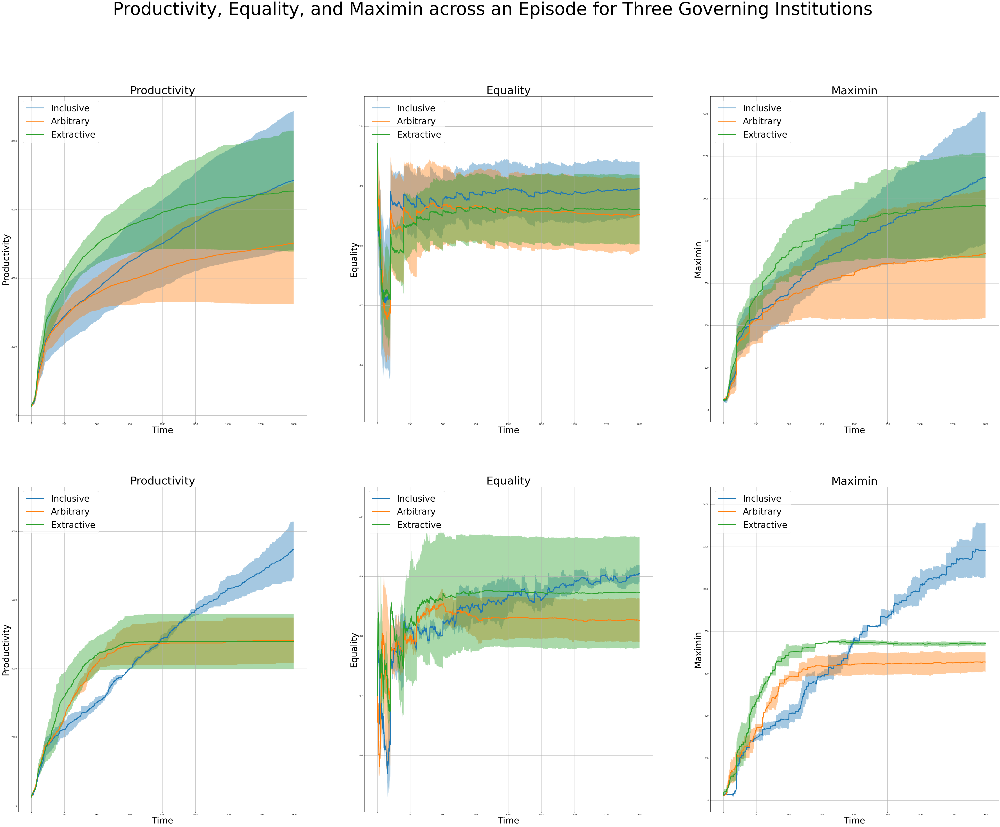

In [10]:
productivity_inclusive = []
productivity_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/productivity.mat')['productivity'])
productivity_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/productivity.mat')['productivity'])
productivity_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/productivity.mat')['productivity'])
productivity_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/productivity.mat')['productivity'])
productivity_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/productivity.mat')['productivity'])
productivity_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/productivity.mat')['productivity'])
productivity_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/productivity.mat')['productivity'])
productivity_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/productivity.mat')['productivity'])
productivity_inclusive = np.array(productivity_inclusive).squeeze(1)

equality_inclusive = []
equality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/equality.mat')['equality'])
equality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/equality.mat')['equality'])
equality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/equality.mat')['equality'])
equality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/equality.mat')['equality'])
equality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/equality.mat')['equality'])
equality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/equality.mat')['equality'])
equality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/equality.mat')['equality'])
equality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/equality.mat')['equality'])
equality_inclusive = np.array(equality_inclusive).squeeze(1)

maximin_inclusive = []
maximin_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/maximin.mat')['maximin'])
maximin_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/maximin.mat')['maximin'])
maximin_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/maximin.mat')['maximin'])
maximin_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/maximin.mat')['maximin'])
maximin_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/maximin.mat')['maximin'])
maximin_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/maximin.mat')['maximin'])
maximin_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/maximin.mat')['maximin'])
maximin_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/maximin.mat')['maximin'])
maximin_inclusive = np.array(maximin_inclusive).squeeze(1)

all_initialinequality_inclusive = []
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/productivity.mat')['productivity'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/productivity.mat')['productivity'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/equality.mat')['equality'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/equality.mat')['equality'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/maximin.mat')['maximin'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/maximin.mat')['maximin'])
all_initialinequality_inclusive = np.array(all_initialinequality_inclusive).squeeze(1)

productivity_arbitrary = []
productivity_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/productivity.mat')['productivity'])
productivity_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/productivity.mat')['productivity'])
productivity_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/productivity.mat')['productivity'])
productivity_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/productivity.mat')['productivity'])
productivity_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/productivity.mat')['productivity'])
productivity_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/productivity.mat')['productivity'])
productivity_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/productivity.mat')['productivity'])
productivity_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/productivity.mat')['productivity'])
productivity_arbitrary = np.array(productivity_arbitrary).squeeze(1)

equality_arbitrary = []
equality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/equality.mat')['equality'])
equality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/equality.mat')['equality'])
equality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/equality.mat')['equality'])
equality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/equality.mat')['equality'])
equality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/equality.mat')['equality'])
equality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/equality.mat')['equality'])
equality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/equality.mat')['equality'])
equality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/equality.mat')['equality'])
equality_arbitrary = np.array(equality_arbitrary).squeeze(1)

maximin_arbitrary = []
maximin_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/maximin.mat')['maximin'])
maximin_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/maximin.mat')['maximin'])
maximin_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/maximin.mat')['maximin'])
maximin_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/maximin.mat')['maximin'])
maximin_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/maximin.mat')['maximin'])
maximin_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/maximin.mat')['maximin'])
maximin_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/maximin.mat')['maximin'])
maximin_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/maximin.mat')['maximin'])
maximin_arbitrary = np.array(maximin_arbitrary).squeeze(1)

all_initialinequality_arbitrary = []
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/productivity.mat')['productivity'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/productivity.mat')['productivity'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/equality.mat')['equality'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/equality.mat')['equality'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/maximin.mat')['maximin'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/maximin.mat')['maximin'])
all_initialinequality_arbitrary = np.array(all_initialinequality_arbitrary).squeeze(1)

productivity_extractive = []
productivity_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/productivity.mat')['productivity'])
productivity_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/productivity.mat')['productivity'])
productivity_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/productivity.mat')['productivity'])
productivity_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/productivity.mat')['productivity'])
productivity_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/productivity.mat')['productivity'])
productivity_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/productivity.mat')['productivity'])
productivity_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/productivity.mat')['productivity'])
productivity_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/productivity.mat')['productivity'])
productivity_extractive = np.array(productivity_extractive).squeeze(1)

equality_extractive = []
equality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/equality.mat')['equality'])
equality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/equality.mat')['equality'])
equality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/equality.mat')['equality'])
equality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/equality.mat')['equality'])
equality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/equality.mat')['equality'])
equality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/equality.mat')['equality'])
equality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/equality.mat')['equality'])
equality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/equality.mat')['equality'])
equality_extractive = np.array(equality_extractive).squeeze(1)

maximin_extractive = []
maximin_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/maximin.mat')['maximin'])
maximin_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/maximin.mat')['maximin'])
maximin_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/maximin.mat')['maximin'])
maximin_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/maximin.mat')['maximin'])
maximin_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/maximin.mat')['maximin'])
maximin_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/maximin.mat')['maximin'])
maximin_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/maximin.mat')['maximin'])
maximin_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/maximin.mat')['maximin'])
maximin_extractive = np.array(maximin_extractive).squeeze(1)

all_initialinequality_extractive = []
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/productivity.mat')['productivity'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/productivity.mat')['productivity'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/equality.mat')['equality'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/equality.mat')['equality'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/maximin.mat')['maximin'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/maximin.mat')['maximin'])
all_initialinequality_extractive = np.array(all_initialinequality_extractive).squeeze(1)

fig, axes = plt.subplots(2, 3, figsize = (40 * 2, 20 * 3), sharex = 'row', sharey = 'col')
fig.suptitle('Productivity, Equality, and Maximin across an Episode for Three Governing Institutions', fontsize = 80)

ax = axes[0, 0]
ax.plot(np.arange(2000), productivity_inclusive.mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), productivity_arbitrary.mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), productivity_extractive.mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), productivity_inclusive.mean(axis = 0) + productivity_inclusive.std(axis = 0), productivity_inclusive.mean(axis = 0) - productivity_inclusive.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), productivity_arbitrary.mean(axis = 0) + productivity_arbitrary.std(axis = 0), productivity_arbitrary.mean(axis = 0) - productivity_arbitrary.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), productivity_extractive.mean(axis = 0) + productivity_extractive.std(axis = 0), productivity_extractive.mean(axis = 0) - productivity_extractive.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Productivity', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Productivity', fontsize = 40)
ax.grid()

ax = axes[0, 1]
ax.plot(np.arange(2000), equality_inclusive.mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), equality_arbitrary.mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), equality_extractive.mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), equality_inclusive.mean(axis = 0) + equality_inclusive.std(axis = 0), equality_inclusive.mean(axis = 0) - equality_inclusive.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), equality_arbitrary.mean(axis = 0) + equality_arbitrary.std(axis = 0), equality_arbitrary.mean(axis = 0) - equality_arbitrary.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), equality_extractive.mean(axis = 0) + equality_extractive.std(axis = 0), equality_extractive.mean(axis = 0) - equality_extractive.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Equality', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Equality', fontsize = 40)
ax.grid()

ax = axes[0, 2]
ax.plot(np.arange(2000), maximin_inclusive.mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), maximin_arbitrary.mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), maximin_extractive.mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), maximin_inclusive.mean(axis = 0) + maximin_inclusive.std(axis = 0), maximin_inclusive.mean(axis = 0) - maximin_inclusive.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), maximin_arbitrary.mean(axis = 0) + maximin_arbitrary.std(axis = 0), maximin_arbitrary.mean(axis = 0) - maximin_arbitrary.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), maximin_extractive.mean(axis = 0) + maximin_extractive.std(axis = 0), maximin_extractive.mean(axis = 0) - maximin_extractive.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Maximin', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Maximin', fontsize = 40)
ax.grid()

ax = axes[1, 0]
ax.plot(np.arange(2000), all_initialinequality_inclusive[0:2, :].mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), all_initialinequality_arbitrary[0:2, :].mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), all_initialinequality_extractive[0:2, :].mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), all_initialinequality_inclusive[0:2, :].mean(axis = 0) + all_initialinequality_inclusive[0:2, :].std(axis = 0), all_initialinequality_inclusive[0:2, :].mean(axis = 0) - all_initialinequality_inclusive[0:2, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_arbitrary[0:2, :].mean(axis = 0) + all_initialinequality_arbitrary[0:2, :].std(axis = 0), all_initialinequality_arbitrary[0:2, :].mean(axis = 0) - all_initialinequality_arbitrary[0:2, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_extractive[0:2, :].mean(axis = 0) + all_initialinequality_extractive[0:2, :].std(axis = 0), all_initialinequality_extractive[0:2, :].mean(axis = 0) - all_initialinequality_extractive[0:2, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Productivity', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Productivity', fontsize = 40)
ax.grid()

ax = axes[1, 1]
ax.plot(np.arange(2000), all_initialinequality_inclusive[2:4, :].mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), all_initialinequality_arbitrary[2:4, :].mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), all_initialinequality_extractive[2:4, :].mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), all_initialinequality_inclusive[2:4, :].mean(axis = 0) + all_initialinequality_inclusive[2:4, :].std(axis = 0), all_initialinequality_inclusive[2:4, :].mean(axis = 0) - all_initialinequality_inclusive[2:4, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_arbitrary[2:4, :].mean(axis = 0) + all_initialinequality_arbitrary[2:4, :].std(axis = 0), all_initialinequality_arbitrary[2:4, :].mean(axis = 0) - all_initialinequality_arbitrary[2:4, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_extractive[2:4, :].mean(axis = 0) + all_initialinequality_extractive[2:4, :].std(axis = 0), all_initialinequality_extractive[2:4, :].mean(axis = 0) - all_initialinequality_extractive[2:4, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Equality', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Equality', fontsize = 40)
ax.grid()

ax = axes[1, 2]
ax.plot(np.arange(2000), all_initialinequality_inclusive[4:, :].mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), all_initialinequality_arbitrary[4:, :].mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), all_initialinequality_extractive[4:, :].mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), all_initialinequality_inclusive[4:, :].mean(axis = 0) + all_initialinequality_inclusive[4:, :].std(axis = 0), all_initialinequality_inclusive[4:, :].mean(axis = 0) - all_initialinequality_inclusive[4:, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_arbitrary[4:, :].mean(axis = 0) + all_initialinequality_arbitrary[4:, :].std(axis = 0), all_initialinequality_arbitrary[4:, :].mean(axis = 0) - all_initialinequality_arbitrary[4:, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_extractive[4:, :].mean(axis = 0) + all_initialinequality_extractive[4:, :].std(axis = 0), all_initialinequality_extractive[4:, :].mean(axis = 0) - all_initialinequality_extractive[4:, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Maximin', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Maximin', fontsize = 40)
ax.grid()

fig.savefig('Productivity, Equality, and Maximin across an Episode for Three Governing Institutions (Project 1).png')

## Amount of three material resources - Wood, Stone, and Iron - in the environment of the Semi-Libertarian/Utilitarian governing system across three governing intitutions: Inclusive, Arbitrary, Extractive

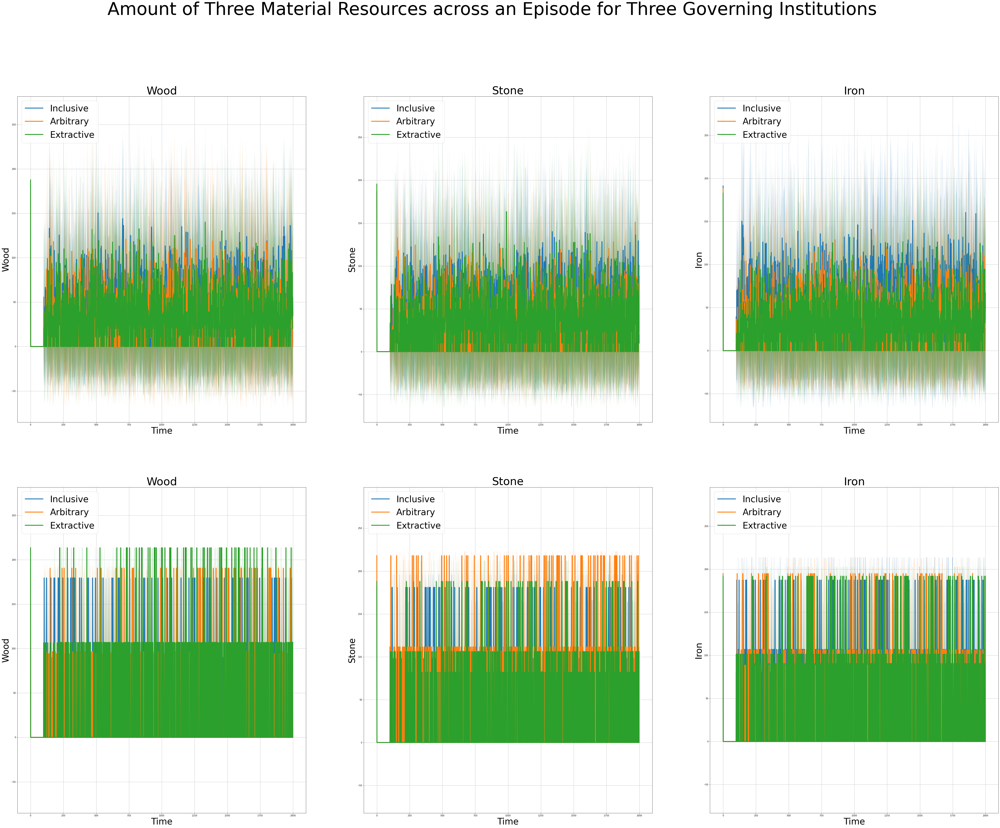

In [11]:
wood_inclusive = []
wood_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/wood_amount_world.mat')['wood_amount_world'])
wood_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/wood_amount_world.mat')['wood_amount_world'])
wood_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/wood_amount_world.mat')['wood_amount_world'])
wood_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/wood_amount_world.mat')['wood_amount_world'])
wood_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/wood_amount_world.mat')['wood_amount_world'])
wood_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/wood_amount_world.mat')['wood_amount_world'])
wood_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/wood_amount_world.mat')['wood_amount_world'])
wood_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/wood_amount_world.mat')['wood_amount_world'])
wood_inclusive = np.array(wood_inclusive).squeeze(1)

stone_inclusive = []
stone_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/stone_amount_world.mat')['stone_amount_world'])
stone_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/stone_amount_world.mat')['stone_amount_world'])
stone_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/stone_amount_world.mat')['stone_amount_world'])
stone_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/stone_amount_world.mat')['stone_amount_world'])
stone_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/stone_amount_world.mat')['stone_amount_world'])
stone_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/stone_amount_world.mat')['stone_amount_world'])
stone_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/stone_amount_world.mat')['stone_amount_world'])
stone_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/stone_amount_world.mat')['stone_amount_world'])
stone_inclusive = np.array(stone_inclusive).squeeze(1)

iron_inclusive = []
iron_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/iron_amount_world.mat')['iron_amount_world'])
iron_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/iron_amount_world.mat')['iron_amount_world'])
iron_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/iron_amount_world.mat')['iron_amount_world'])
iron_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/iron_amount_world.mat')['iron_amount_world'])
iron_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/iron_amount_world.mat')['iron_amount_world'])
iron_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/iron_amount_world.mat')['iron_amount_world'])
iron_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/iron_amount_world.mat')['iron_amount_world'])
iron_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/iron_amount_world.mat')['iron_amount_world'])
iron_inclusive = np.array(iron_inclusive).squeeze(1)

all_initialinequality_inclusive = []
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_inclusive = np.array(all_initialinequality_inclusive).squeeze(1)

wood_arbitrary = []
wood_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/wood_amount_world.mat')['wood_amount_world'])
wood_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/wood_amount_world.mat')['wood_amount_world'])
wood_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/wood_amount_world.mat')['wood_amount_world'])
wood_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/wood_amount_world.mat')['wood_amount_world'])
wood_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/wood_amount_world.mat')['wood_amount_world'])
wood_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/wood_amount_world.mat')['wood_amount_world'])
wood_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/wood_amount_world.mat')['wood_amount_world'])
wood_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/wood_amount_world.mat')['wood_amount_world'])
wood_arbitrary = np.array(wood_arbitrary).squeeze(1)

stone_arbitrary = []
stone_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/stone_amount_world.mat')['stone_amount_world'])
stone_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/stone_amount_world.mat')['stone_amount_world'])
stone_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/stone_amount_world.mat')['stone_amount_world'])
stone_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/stone_amount_world.mat')['stone_amount_world'])
stone_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/stone_amount_world.mat')['stone_amount_world'])
stone_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/stone_amount_world.mat')['stone_amount_world'])
stone_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/stone_amount_world.mat')['stone_amount_world'])
stone_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/stone_amount_world.mat')['stone_amount_world'])
stone_arbitrary = np.array(stone_arbitrary).squeeze(1)

iron_arbitrary = []
iron_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/iron_amount_world.mat')['iron_amount_world'])
iron_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/iron_amount_world.mat')['iron_amount_world'])
iron_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/iron_amount_world.mat')['iron_amount_world'])
iron_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/iron_amount_world.mat')['iron_amount_world'])
iron_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/iron_amount_world.mat')['iron_amount_world'])
iron_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/iron_amount_world.mat')['iron_amount_world'])
iron_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/iron_amount_world.mat')['iron_amount_world'])
iron_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/iron_amount_world.mat')['iron_amount_world'])
iron_arbitrary = np.array(iron_arbitrary).squeeze(1)

all_initialinequality_arbitrary = []
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_arbitrary = np.array(all_initialinequality_arbitrary).squeeze(1)

wood_extractive = []
wood_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/wood_amount_world.mat')['wood_amount_world'])
wood_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/wood_amount_world.mat')['wood_amount_world'])
wood_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/wood_amount_world.mat')['wood_amount_world'])
wood_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/wood_amount_world.mat')['wood_amount_world'])
wood_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/wood_amount_world.mat')['wood_amount_world'])
wood_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/wood_amount_world.mat')['wood_amount_world'])
wood_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/wood_amount_world.mat')['wood_amount_world'])
wood_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/wood_amount_world.mat')['wood_amount_world'])
wood_extractive = np.array(wood_extractive).squeeze(1)

stone_extractive = []
stone_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/stone_amount_world.mat')['stone_amount_world'])
stone_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/stone_amount_world.mat')['stone_amount_world'])
stone_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/stone_amount_world.mat')['stone_amount_world'])
stone_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/stone_amount_world.mat')['stone_amount_world'])
stone_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/stone_amount_world.mat')['stone_amount_world'])
stone_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/stone_amount_world.mat')['stone_amount_world'])
stone_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/stone_amount_world.mat')['stone_amount_world'])
stone_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/stone_amount_world.mat')['stone_amount_world'])
stone_extractive = np.array(stone_extractive).squeeze(1)

iron_extractive = []
iron_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/iron_amount_world.mat')['iron_amount_world'])
iron_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/iron_amount_world.mat')['iron_amount_world'])
iron_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/iron_amount_world.mat')['iron_amount_world'])
iron_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/iron_amount_world.mat')['iron_amount_world'])
iron_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/iron_amount_world.mat')['iron_amount_world'])
iron_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/iron_amount_world.mat')['iron_amount_world'])
iron_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/iron_amount_world.mat')['iron_amount_world'])
iron_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/iron_amount_world.mat')['iron_amount_world'])
iron_extractive = np.array(iron_extractive).squeeze(1)

all_initialinequality_extractive = []
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/wood_amount_world.mat')['wood_amount_world'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/stone_amount_world.mat')['stone_amount_world'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/iron_amount_world.mat')['iron_amount_world'])
all_initialinequality_extractive = np.array(all_initialinequality_extractive).squeeze(1)

fig, axes = plt.subplots(2, 3, figsize = (40 * 2, 20 * 3), sharex = 'row', sharey = 'col')
fig.suptitle('Amount of Three Material Resources across an Episode for Three Governing Institutions', fontsize = 80)

ax = axes[0, 0]
ax.plot(np.arange(2000), wood_inclusive.mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), wood_arbitrary.mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), wood_extractive.mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), wood_inclusive.mean(axis = 0) + wood_inclusive.std(axis = 0), wood_inclusive.mean(axis = 0) - wood_inclusive.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), wood_arbitrary.mean(axis = 0) + wood_arbitrary.std(axis = 0), wood_arbitrary.mean(axis = 0) - wood_arbitrary.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), wood_extractive.mean(axis = 0) + wood_extractive.std(axis = 0), wood_extractive.mean(axis = 0) - wood_extractive.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Wood', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Wood', fontsize = 40)
ax.grid()

ax = axes[0, 1]
ax.plot(np.arange(2000), stone_inclusive.mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), stone_arbitrary.mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), stone_extractive.mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), stone_inclusive.mean(axis = 0) + stone_inclusive.std(axis = 0), stone_inclusive.mean(axis = 0) - stone_inclusive.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), stone_arbitrary.mean(axis = 0) + stone_arbitrary.std(axis = 0), stone_arbitrary.mean(axis = 0) - stone_arbitrary.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), stone_extractive.mean(axis = 0) + stone_extractive.std(axis = 0), stone_extractive.mean(axis = 0) - stone_extractive.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Stone', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Stone', fontsize = 40)
ax.grid()

ax = axes[0, 2]
ax.plot(np.arange(2000), iron_inclusive.mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), iron_arbitrary.mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), iron_extractive.mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), iron_inclusive.mean(axis = 0) + iron_inclusive.std(axis = 0), iron_inclusive.mean(axis = 0) - iron_inclusive.std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), iron_arbitrary.mean(axis = 0) + iron_arbitrary.std(axis = 0), iron_arbitrary.mean(axis = 0) - iron_arbitrary.std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), iron_extractive.mean(axis = 0) + iron_extractive.std(axis = 0), iron_extractive.mean(axis = 0) - iron_extractive.std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Iron', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Iron', fontsize = 40)
ax.grid()

ax = axes[1, 0]
ax.plot(np.arange(2000), all_initialinequality_inclusive[0:2, :].mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), all_initialinequality_arbitrary[0:2, :].mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), all_initialinequality_extractive[0:2, :].mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), all_initialinequality_inclusive[0:2, :].mean(axis = 0) + all_initialinequality_inclusive[0:2, :].std(axis = 0), all_initialinequality_inclusive[0:2, :].mean(axis = 0) - all_initialinequality_inclusive[0:2, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_arbitrary[0:2, :].mean(axis = 0) + all_initialinequality_arbitrary[0:2, :].std(axis = 0), all_initialinequality_arbitrary[0:2, :].mean(axis = 0) - all_initialinequality_arbitrary[0:2, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_extractive[0:2, :].mean(axis = 0) + all_initialinequality_extractive[0:2, :].std(axis = 0), all_initialinequality_extractive[0:2, :].mean(axis = 0) - all_initialinequality_extractive[0:2, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Wood', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Wood', fontsize = 40)
ax.grid()

ax = axes[1, 1]
ax.plot(np.arange(2000), all_initialinequality_inclusive[2:4, :].mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), all_initialinequality_arbitrary[2:4, :].mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), all_initialinequality_extractive[2:4, :].mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), all_initialinequality_inclusive[2:4, :].mean(axis = 0) + all_initialinequality_inclusive[2:4, :].std(axis = 0), all_initialinequality_inclusive[2:4, :].mean(axis = 0) - all_initialinequality_inclusive[2:4, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_arbitrary[2:4, :].mean(axis = 0) + all_initialinequality_arbitrary[2:4, :].std(axis = 0), all_initialinequality_arbitrary[2:4, :].mean(axis = 0) - all_initialinequality_arbitrary[2:4, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_extractive[2:4, :].mean(axis = 0) + all_initialinequality_extractive[2:4, :].std(axis = 0), all_initialinequality_extractive[2:4, :].mean(axis = 0) - all_initialinequality_extractive[2:4, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Stone', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Stone', fontsize = 40)
ax.grid()

ax = axes[1, 2]
ax.plot(np.arange(2000), all_initialinequality_inclusive[4:, :].mean(axis = 0), lw = 4, label = 'Inclusive')
ax.plot(np.arange(2000), all_initialinequality_arbitrary[4:, :].mean(axis = 0), lw = 4, label = 'Arbitrary')
ax.plot(np.arange(2000), all_initialinequality_extractive[4:, :].mean(axis = 0), lw = 4, label = 'Extractive')
ax.fill_between(np.arange(2000), all_initialinequality_inclusive[4:, :].mean(axis = 0) + all_initialinequality_inclusive[4:, :].std(axis = 0), all_initialinequality_inclusive[4:, :].mean(axis = 0) - all_initialinequality_inclusive[4:, :].std(axis = 0), facecolor = 'C0', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_arbitrary[4:, :].mean(axis = 0) + all_initialinequality_arbitrary[4:, :].std(axis = 0), all_initialinequality_arbitrary[4:, :].mean(axis = 0) - all_initialinequality_arbitrary[4:, :].std(axis = 0), facecolor = 'C1', alpha = 0.4)
ax.fill_between(np.arange(2000), all_initialinequality_extractive[4:, :].mean(axis = 0) + all_initialinequality_extractive[4:, :].std(axis = 0), all_initialinequality_extractive[4:, :].mean(axis = 0) - all_initialinequality_extractive[4:, :].std(axis = 0), facecolor = 'C2', alpha = 0.4)
ax.legend(loc = 'upper left', fontsize = 40)
ax.set_title('Iron', fontsize = 50)
ax.set_xlabel('Time', fontsize = 40)
ax.set_ylabel('Iron', fontsize = 40)
ax.grid()

fig.savefig('Amount of Three Material Resources across an Episode for Three Governing Institutions (Project 1).png')

## Difference between Taxes and Shapley Values in the Semi-Libertarian/Utilitarian governing system across three governing institutions: Inclusive, Arbitrary, Extractive

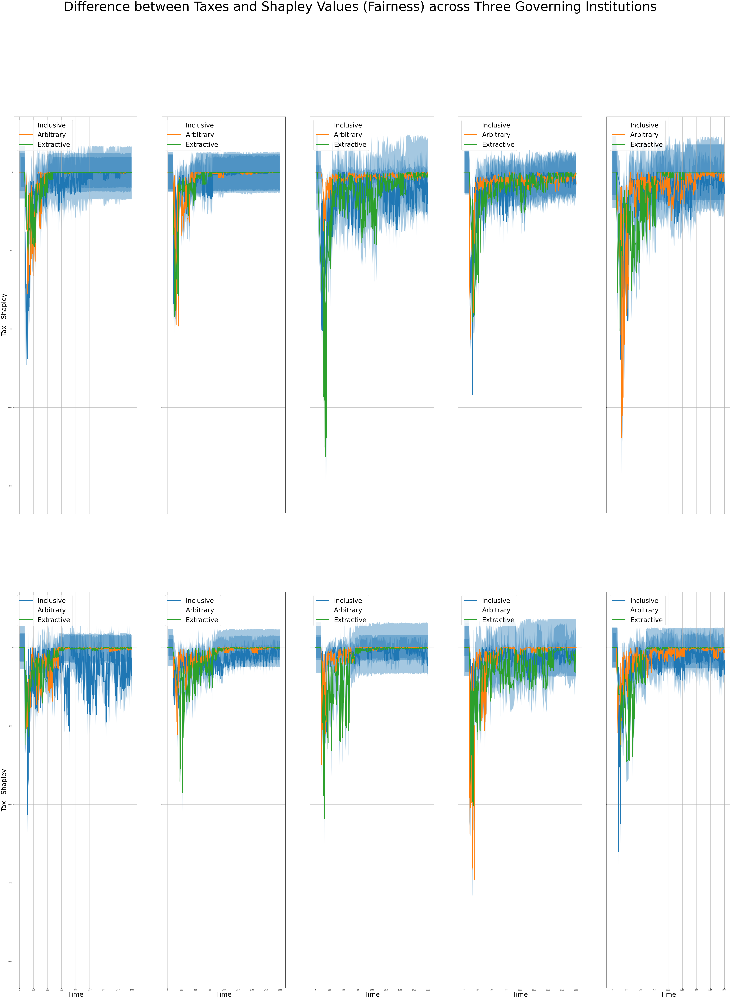

In [12]:
tax_inclusive = []
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/tax_value.mat')['tax_value'])
tax_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/tax_value.mat')['tax_value'])

shapley_inclusive = []
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/shapley_value.mat')['shapley_value'])
shapley_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/shapley_value.mat')['shapley_value'])

time_inclusive = []
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[29] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[32] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/ts.mat')['ts'].squeeze(0))
time_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/ts.mat')['ts'].squeeze(0))

tax_arbitrary = []
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/tax_value.mat')['tax_value'])
tax_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/tax_value.mat')['tax_value'])

shapley_arbitrary = []
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/shapley_value.mat')['shapley_value'])
shapley_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/shapley_value.mat')['shapley_value'])

time_arbitrary = []
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[27] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[30] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/ts.mat')['ts'].squeeze(0))
time_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/ts.mat')['ts'].squeeze(0))

tax_extractive = []
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/tax_value.mat')['tax_value'])
tax_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/tax_value.mat')['tax_value'])

shapley_extractive = []
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/shapley_value.mat')['shapley_value'])
shapley_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/shapley_value.mat')['shapley_value'])

time_extractive = []
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[28] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[31] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/ts.mat')['ts'].squeeze(0))
time_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/ts.mat')['ts'].squeeze(0))

fig, axes = plt.subplots(2, 5, figsize = (40 * 2, 20 * 5), sharex = "col", sharey = "all")
fig.suptitle('Difference between Taxes and Shapley Values (Fairness) across Three Governing Institutions', fontsize = 80)

for i in range(2):
    for j in range(5):
        ax = axes[i, j]        
        ax.plot(time_inclusive[5 * i + j], tax_inclusive[5 * i + j].mean(axis = 1) - shapley_inclusive[5 * i + j].mean(axis = 1), lw = 4, label = 'Inclusive')
        ax.plot(time_arbitrary[5 * i + j], tax_arbitrary[5 * i + j].mean(axis = 1) - shapley_arbitrary[5 * i + j].mean(axis = 1), lw = 4, label = 'Arbitrary')
        ax.plot(time_extractive[5 * i + j], tax_extractive[5 * i + j].mean(axis = 1) - shapley_extractive[5 * i + j].mean(axis = 1), lw = 4, label = 'Extractive')
        ax.fill_between(time_inclusive[5 * i + j], tax_inclusive[5 * i + j].mean(axis = 1) - shapley_inclusive[5 * i + j].mean(axis = 1) + (tax_inclusive[5 * i + j].mean(axis = 1) - shapley_inclusive[5 * i + j].mean(axis = 1)).std(axis = 0), tax_inclusive[5 * i + j].mean(axis = 1) - shapley_inclusive[5 * i + j].mean(axis = 1) - (tax_inclusive[5 * i + j].mean(axis = 1) - shapley_inclusive[5 * i + j].mean(axis = 1)).std(axis = 0), facecolor = 'C0', alpha = 0.4)
        ax.fill_between(time_arbitrary[5 * i + j], tax_arbitrary[5 * i + j].mean(axis = 1) - shapley_arbitrary[5 * i + j].mean(axis = 1) + (tax_arbitrary[5 * i + j].mean(axis = 1) - shapley_arbitrary[5 * i + j].mean(axis = 1)).std(axis = 0), tax_arbitrary[5 * i + j].mean(axis = 1) - shapley_arbitrary[5 * i + j].mean(axis = 1) - (tax_arbitrary[5 * i + j].mean(axis = 1) - shapley_arbitrary[5 * i + j].mean(axis = 1)).std(axis = 0), facecolor = 'C0', alpha = 0.4)
        ax.fill_between(time_extractive[5 * i + j], tax_extractive[5 * i + j].mean(axis = 1) - shapley_extractive[5 * i + j].mean(axis = 1) + (tax_extractive[5 * i + j].mean(axis = 1) - shapley_extractive[5 * i + j].mean(axis = 1)).std(axis = 0), tax_extractive[5 * i + j].mean(axis = 1) - shapley_extractive[5 * i + j].mean(axis = 1) - (tax_extractive[5 * i + j].mean(axis = 1) - shapley_extractive[5 * i + j].mean(axis = 1)).std(axis = 0), facecolor = 'C0', alpha = 0.4)
        ax.legend(loc = 'upper left', fontsize = 40)   
        ax.grid()

        if i == 1:
            ax.set_xlabel('Time', fontsize = 40)
        if j == 0:
            ax.set_ylabel('Tax - Shapley', fontsize = 40)
        
fig.savefig('Difference between Taxes and Shapley Values (Fairness) across Three Governing Institutions (Project 1).png')

## Causal Influence as a Sense of Agency for market prices of three material resources and votes of the agents across three governing systems: Full-Libertarian, Semi-Libertarian/Utilitarian, Full-Utilitarian

Unfortunately, due to a bug in the earlier version of the program, only the causal coefficients of the last agent have been saved. As a result, the following plots only summarize the causal influences of the last agent in each one of the governing systems, and they are not authentic representative of the overall causal influence. 

In [13]:
model_2_estimate_full_libertarian = []
model_2_estimate_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[0] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[1] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[2] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[3] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[4] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[7] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[8] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_libertarian.append(scipy.io.loadmat(parent_folder + results_subfolders[9] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_libertarian = np.array(model_2_estimate_full_libertarian).squeeze(1)

model_2_estimate_semi_libertarian_utilitarian = []
model_2_estimate_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/model_results_2_estimate.mat')['model_results_2_estimate']) 
model_2_estimate_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_semi_libertarian_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_semi_libertarian_utilitarian = np.array(model_2_estimate_semi_libertarian_utilitarian).squeeze(1)

model_2_estimate_full_utilitarian = []
model_2_estimate_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[44] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[45] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[46] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[47] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[48] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[51] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[52] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_utilitarian.append(scipy.io.loadmat(parent_folder + results_subfolders[53] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_full_utilitarian = np.array(model_2_estimate_full_utilitarian).squeeze(1)

fig, axes = plt.subplots(3, 1, figsize = (120, 120), sharex = 'col', sharey = 'col')
fig.suptitle('Causal Influence as a Sense of Agency for Market Prices of Three Material Resources across Three Governing Systems', fontsize = 120)

x = np.arange(6)
causal_coefficients_names = ['WoodWorld', 'StoneWorld', 'IronWorld', 'WoodAgent', 'StoneAgent', 'IronAgent']
width = 0.30

ax = axes[0]

ax.bar(x - width, 
       model_2_estimate_full_libertarian.mean(axis = 0)[0:6], 
       width,
       yerr = model_2_estimate_full_libertarian.std(axis = 0)[0:6],
       label = 'Full-Libertarian',
       color = 'b')

ax.bar(x, 
       model_2_estimate_semi_libertarian_utilitarian.mean(axis = 0)[0:6],
       width,
       yerr = model_2_estimate_semi_libertarian_utilitarian.std(axis = 0)[0:6], 
       label = 'Semi-Libertarian/Utilitarian',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_full_utilitarian.mean(axis = 0)[0:6],
       width,
       yerr = model_2_estimate_full_utilitarian.std(axis = 0)[0:6],
       label = 'Full-Utilitarian',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Market Prices of Wood across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

ax = axes[1]

ax.bar(x - width, 
       model_2_estimate_full_libertarian.mean(axis = 0)[6:12], 
       width,
       yerr = model_2_estimate_full_libertarian.std(axis = 0)[6:12],
       label = 'Full-Libertarian',
       color = 'b')

ax.bar(x, 
       model_2_estimate_semi_libertarian_utilitarian.mean(axis = 0)[6:12],
       width,
       yerr = model_2_estimate_semi_libertarian_utilitarian.std(axis = 0)[6:12], 
       label = 'Semi-Libertarian/Utilitarian',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_full_utilitarian.mean(axis = 0)[6:12],
       width,
       yerr = model_2_estimate_full_utilitarian.std(axis = 0)[6:12],
       label = 'Full-Utilitarian',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Market Prices of Stone across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

ax = axes[2]

ax.bar(x - width, 
       model_2_estimate_full_libertarian.mean(axis = 0)[12:18], 
       width,
       yerr = model_2_estimate_full_libertarian.std(axis = 0)[12:18],
       label = 'Full-Libertarian',
       color = 'b')

ax.bar(x, 
       model_2_estimate_semi_libertarian_utilitarian.mean(axis = 0)[12:18],
       width,
       yerr = model_2_estimate_semi_libertarian_utilitarian.std(axis = 0)[12:18], 
       label = 'Semi-Libertarian/Utilitarian',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_full_utilitarian.mean(axis = 0)[12:18],
       width,
       yerr = model_2_estimate_full_utilitarian.std(axis = 0)[12:18],
       label = 'Full-Utilitarian',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Market Prices of Iron across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

fig.savefig('Causal Influence as a Sense of Agency for Market Prices of Three Material Resources across Three Governing Systems (Project 1).png')

fig, axes = plt.subplots(3, 1, figsize = (120, 120), sharex = 'col', sharey = 'col')
fig.suptitle('Causal Influence as a Sense of Agency for Votes of Agents across Three Governing Systems', fontsize = 120)

x = np.arange(9)
causal_coefficients_names = ['WoodWorld', 'StoneWorld', 'IronWorld', 'WoodAgent', 'StoneAgent', 'IronAgent', 'WoodPrice', 'StonePrice', 'IronPrice']
width = 0.30

ax = axes[0]

ax.bar(x - width, 
       model_2_estimate_full_libertarian.mean(axis = 0)[18:27], 
       width,
       yerr = model_2_estimate_full_libertarian.std(axis = 0)[18:27],
       label = 'Full-Libertarian',
       color = 'b')

ax.bar(x, 
       model_2_estimate_semi_libertarian_utilitarian.mean(axis = 0)[18:27],
       width,
       yerr = model_2_estimate_semi_libertarian_utilitarian.std(axis = 0)[18:27], 
       label = 'Semi-Libertarian/Utilitarian',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_full_utilitarian.mean(axis = 0)[18:27],
       width,
       yerr = model_2_estimate_full_utilitarian.std(axis = 0)[18:27],
       label = 'Full-Utilitarian',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Vote of Wood across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

ax = axes[1]

ax.bar(x - width, 
       model_2_estimate_full_libertarian.mean(axis = 0)[27:36], 
       width,
       yerr = model_2_estimate_full_libertarian.std(axis = 0)[27:36],
       label = 'Full-Libertarian',
       color = 'b')

ax.bar(x, 
       model_2_estimate_semi_libertarian_utilitarian.mean(axis = 0)[27:36],
       width,
       yerr = model_2_estimate_semi_libertarian_utilitarian.std(axis = 0)[27:36], 
       label = 'Semi-Libertarian/Utilitarian',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_full_utilitarian.mean(axis = 0)[27:36],
       width,
       yerr = model_2_estimate_full_utilitarian.std(axis = 0)[27:36],
       label = 'Full-Utilitarian',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Vote of Stone across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

ax = axes[2]

ax.bar(x - width, 
       model_2_estimate_full_libertarian.mean(axis = 0)[36:45], 
       width,
       yerr = model_2_estimate_full_libertarian.std(axis = 0)[36:45],
       label = 'Full-Libertarian',
       color = 'b')

ax.bar(x, 
       model_2_estimate_semi_libertarian_utilitarian.mean(axis = 0)[36:45],
       width,
       yerr = model_2_estimate_semi_libertarian_utilitarian.std(axis = 0)[36:45], 
       label = 'Semi-Libertarian/Utilitarian',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_full_utilitarian.mean(axis = 0)[36:45],
       width,
       yerr = model_2_estimate_full_utilitarian.std(axis = 0)[36:45],
       label = 'Full-Utilitarian',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Vote of Iron across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

fig.savefig('Causal Influence as a Sense of Agency for Votes of Agents across Three Governing Systems (Project 1).png')

## Causal Influence as a Sense of Agency for market prices of three material resources and votes of the agents in the Semi-Libertarian/Utilitarian system across three governing institutions: Inclusive, Arbitrary, Extractive

Unfortunately, due to a bug in the earlier version of the program, only the causal coefficients of the last agent have been saved. As a result, the following plots only summarize the causal influences of the last agent in each one of the governing institutions, and they are not authentic representative of the overall causal influence.

In [14]:
model_2_estimate_inclusive = []
model_2_estimate_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[12] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[15] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[18] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[21] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[24] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[35] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[38] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_inclusive.append(scipy.io.loadmat(parent_folder + results_subfolders[41] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_inclusive = np.array(model_2_estimate_inclusive).squeeze(1)

model_2_estimate_arbitrary = []
model_2_estimate_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[10] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[13] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[16] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[19] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[22] + '/model_results_2_estimate.mat')['model_results_2_estimate']) 
model_2_estimate_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[33] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[36] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_arbitrary.append(scipy.io.loadmat(parent_folder + results_subfolders[39] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_arbitrary = np.array(model_2_estimate_arbitrary).squeeze(1)

model_2_estimate_extractive = []
model_2_estimate_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[11] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[14] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[17] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[20] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[23] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[34] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[37] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_extractive.append(scipy.io.loadmat(parent_folder + results_subfolders[40] + '/model_results_2_estimate.mat')['model_results_2_estimate'])
model_2_estimate_extractive = np.array(model_2_estimate_extractive).squeeze(1)

fig, axes = plt.subplots(3, 1, figsize = (120, 120), sharex = 'col', sharey = 'col')
fig.suptitle('Causal Influence as a Sense of Agency for Market Prices of Three Material Resources across Three Governing Institutions', fontsize = 120)

x = np.arange(6)
causal_coefficients_names = ['WoodWorld', 'StoneWorld', 'IronWorld', 'WoodAgent', 'StoneAgent', 'IronAgent']
width = 0.30

ax = axes[0]

ax.bar(x - width, 
       model_2_estimate_inclusive.mean(axis = 0)[0:6], 
       width,
       yerr = model_2_estimate_inclusive.std(axis = 0)[0:6],
       label = 'Inclusive',
       color = 'b')

ax.bar(x, 
       model_2_estimate_arbitrary.mean(axis = 0)[0:6],
       width,
       yerr = model_2_estimate_arbitrary.std(axis = 0)[0:6], 
       label = 'Arbitrary',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_extractive.mean(axis = 0)[0:6],
       width,
       yerr = model_2_estimate_extractive.std(axis = 0)[0:6],
       label = 'Extractive',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Market Prices of Wood across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

ax = axes[1]

ax.bar(x - width, 
       model_2_estimate_inclusive.mean(axis = 0)[6:12], 
       width,
       yerr = model_2_estimate_inclusive.std(axis = 0)[6:12],
       label = 'Inclusive',
       color = 'b')

ax.bar(x, 
       model_2_estimate_arbitrary.mean(axis = 0)[6:12],
       width,
       yerr = model_2_estimate_arbitrary.std(axis = 0)[6:12], 
       label = 'Arbitrary',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_extractive.mean(axis = 0)[6:12],
       width,
       yerr = model_2_estimate_extractive.std(axis = 0)[6:12],
       label = 'Extractive',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Market Prices of Stone across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

ax = axes[2]

ax.bar(x - width, 
       model_2_estimate_inclusive.mean(axis = 0)[12:18], 
       width,
       yerr = model_2_estimate_inclusive.std(axis = 0)[12:18],
       label = 'Inclusive',
       color = 'b')

ax.bar(x, 
       model_2_estimate_arbitrary.mean(axis = 0)[12:18],
       width,
       yerr = model_2_estimate_arbitrary.std(axis = 0)[12:18], 
       label = 'Arbitrary',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_extractive.mean(axis = 0)[12:18],
       width,
       yerr = model_2_estimate_extractive.std(axis = 0)[12:18],
       label = 'Extractive',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Market Prices of Iron across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

fig.savefig('Causal Influence as a Sense of Agency for Market Prices of Three Material Resources across Three Governing Institutions (Project 1).png')

fig, axes = plt.subplots(3, 1, figsize = (120, 120), sharex = 'col', sharey = 'col')
fig.suptitle('Causal Influence as a Sense of Agency for Votes of Agents across Three Governing Institutions', fontsize = 120)

x = np.arange(9)
causal_coefficients_names = ['WoodWorld', 'StoneWorld', 'IronWorld', 'WoodAgent', 'StoneAgent', 'IronAgent', 'WoodPrice', 'StonePrice', 'IronPrice']
width = 0.30

ax = axes[0]

ax.bar(x - width, 
       model_2_estimate_inclusive.mean(axis = 0)[18:27], 
       width,
       yerr = model_2_estimate_inclusive.std(axis = 0)[18:27],
       label = 'Inclusive',
       color = 'b')

ax.bar(x, 
       model_2_estimate_arbitrary.mean(axis = 0)[18:27],
       width,
       yerr = model_2_estimate_arbitrary.std(axis = 0)[18:27], 
       label = 'Arbitrary',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_extractive.mean(axis = 0)[18:27],
       width,
       yerr = model_2_estimate_extractive.std(axis = 0)[18:27],
       label = 'Extractive',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Vote of Wood across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

ax = axes[1]

ax.bar(x - width, 
       model_2_estimate_inclusive.mean(axis = 0)[27:36], 
       width,
       yerr = model_2_estimate_inclusive.std(axis = 0)[27:36],
       label = 'Inclusive',
       color = 'b')

ax.bar(x, 
       model_2_estimate_arbitrary.mean(axis = 0)[27:36],
       width,
       yerr = model_2_estimate_arbitrary.std(axis = 0)[27:36], 
       label = 'Arbitrary',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_extractive.mean(axis = 0)[27:36],
       width,
       yerr = model_2_estimate_extractive.std(axis = 0)[27:36],
       label = 'Extractive',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Vote of Stone across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

ax = axes[2]

ax.bar(x - width, 
       model_2_estimate_inclusive.mean(axis = 0)[36:45], 
       width,
       yerr = model_2_estimate_inclusive.std(axis = 0)[36:45],
       label = 'Inclusive',
       color = 'b')

ax.bar(x, 
       model_2_estimate_arbitrary.mean(axis = 0)[36:45],
       width,
       yerr = model_2_estimate_arbitrary.std(axis = 0)[36:45], 
       label = 'Arbitrary',
       color = 'g')

ax.bar(x + width, 
       model_2_estimate_extractive.mean(axis = 0)[36:45],
       width,
       yerr = model_2_estimate_extractive.std(axis = 0)[36:45],
       label = 'Extractive',
       color = 'r')

ax.set_xlim(left = min(x) - 0.5, right = max(x) + 0.5)
ax.set_xticks(ticks = x)
ax.set_xticklabels(causal_coefficients_names, rotation = 60, fontsize = 80)
ax.set_ylabel('Average Value of Causal Coefficients', fontsize = 80)
ax.set_title('Causal Influence as a Sense of Agency for Vote of Iron across Three Governing Systems', fontsize = 80)
ax.legend(frameon = True, loc = 1, fontsize = 80)

fig.savefig('Causal Influence as a Sense of Agency for Votes of Agents across Three Governing Institutions (Project 1).png')